<!-- # Possible titles/angles -->
<!-- 1. inter-annual drivers of US east and Gulf Coast sea level (Steve, Jake, Anthony, Denis?) -->
# Connecting NAO, GS path variations, and coastal sea level along the USEC

# Introduction/Background

Many disparate pieces of the puzzle have been discussed: 
1. Valle-Levinson, McCarthy, Volkov, others link coastal sea level to NAO: sometimes a single signed mode south of Hatteras, sometimes anti-phase N/S.
2. Wu and He -- SEUS sea level driven by connection to GS detachment SSH variability -- which is correlated with NAO.
3. Others (Andres/others) have noted a strong anticorrelation between N of Hatteras sea level and GS offshore.
4. Wang papers have identified drivers and relevant forcing regions using B+M experiments, but always in relatively coarse model. Haven’t looked at details of alongcoast structure.
   * Sensitivity maps don’t show SSH in the GS path region.
   <!-- * because forcing is nonlocal but the path mediates. -->
   * Could be different because ECCO is coarse resolution.


Leaves questions:
1. Is NAO-associated sea level response a dipole, and what drives it? Does N/S coherence arise from dynamics or forcing? Remote or local?
2. What is the connection between large scale forcing (B+M), GS path migration, and coastal sea level? Are path migrations intrinsic, wind-forced, or is there a role for buoyancy, perhaps due to DWBC/slope current involvement?
3. Are results resolution-dependent?
 
<!-- * Little 24/25 points to notable differences at high rez. GRL paper focuses on a higher frequency mode. Here we remove the common mode and analyze what's left.
* By focusing on common spatial modes, lessen the effect of local errors. Also preserve alongcoast coherence. 
 -->
Here the goal is to:
1. consolidate various interpretations of structure and drivers
2. analyze the ability of these processes mode to be represented in global forced/coupled climate models.

# key points

1. The leading mode of interannual USEC sea level variability over the altimeter era is a coherent dipole, and arises from temporally correlated, NAO-assocaited, forcing in different regions of the N Atlantic [sea level acts as a lowpass filter]
    * Consistent with other studies, [remote] buoyancy forcing drives variabity north of hatteras, [remote] wind forcing to the south.
    * Buoyancy-forced sea level variability from the SPG (coastal pathway) and STG (offshore pathway) offset south of Cape Hatteras
      
2. Momentum-forced sea level variability on the SEUS Coast is linked to a propagating steric signal from the Caribbean (Chris Pitt-Wolfe?) and a correlated onshore migration of the Gulf Stream. Both of these are driven by STG wind stress, although the local and remote wind-driven component of path migration, and their interaction, cannot be completely separated.
    * Can we dig into the dynamics of the GS path/rossby wave interaction?

3. Representation of the dipole is improved at high resolution due to:
    * Restriction of the momentum-forced signal to the south of Cape Hatteras; although the buoyancy forced signal is too strong north of CH in LR [note long-term ramifications], it is over-compensated by opposite-signed momentum forced coastal sea level changes.
    * [Or, maybe the timing of the B+M terms is off!]
      
* Extra/Lower/different priority:
    * [the recent acceleration is largely linked to the dipole mode]
    * Common variability forced by NEUS alongshore winds, and communicated through coastal waveguides, remains important over interannual timescales -- valuable to remove it.

## Import required packages, global parameters, functions

In [94]:
%load_ext autoreload
%autoreload 2
import xarray as xr 
import numpy as np  
import cftime
from scipy import signal
import scipy as sp
from scipy import io

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as xccrs
import cartopy.feature as cfeature
%matplotlib inline
import momlevel
import datetime as dt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
from mypyutils import colormap_utils as mycolors
mdates.MonthLocator(bymonthday=15)

plt.rcParams.update({
    "text.usetex": True,
    "font.family": 'serif',
    "font.serif": 'Computer Modern'
})    

cols=['k','C1','C0','C2','C3','C4','C5','C6']   
lines = ["-","--",":",":"]
panellabs=list(map(chr, range(97, 112)))
rotated_crs = xccrs.RotatedPole(pole_longitude=25.0, pole_latitude=70.0) # define projection!

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
import sys
sys.path.append("./../NSF-OCE_2148596/notebooks/pacific_HRDP_DPLE/lfca/Python")
from signal_processing import lfca

In [6]:
def tg_lfca(da, cutoff, truncation):
    lat_axis = da.tgindex.values
    time = da.time.values
    sst = da.to_numpy().squeeze()
    nlat = da.shape[1]
    ntime = da.shape[0]
    x = da.values
    area_weights = da[0, :] * 0 + 1
    area_weights = np.expand_dims(area_weights, axis=0)
    area_weights
    normvec = np.transpose(area_weights) / np.sum(area_weights)
    scale = np.sqrt(normvec)
    (
        lfcs,
        lfps,
        weights,
        r,
        pvar,
        pcs,
        eofs,
        ntr,
        pvar_slow,
        pvar_lfc,
        r_eofs,
        pvar_slow_eofs,
        lf_ts,
    ) = lfca(x, cutoff, truncation, scale)

    return lfcs, lfps, weights, r, pvar, pcs, eofs, ntr, pvar_slow, pvar_lfc, r_eofs, pvar_slow_eofs, lf_ts

In [7]:
def butter_bpfilt_high(x,filt_year1,filt_year2,fs,order_butter):
    fc1 = filt_year1 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    fc2 = filt_year2 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    b, a = signal.butter(order_butter, [fc1], fs=fs, btype='high')
    return signal.filtfilt(b, a, x)
    
def butter_bpfilt_band(x,filt_year1,filt_year2,fs,order_butter):
    fc1 = filt_year1 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    fc2 = filt_year2 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    b, a = signal.butter(order_butter, [fc1, fc2], fs=fs, btype='band')
    return signal.filtfilt(b, a, x)
    
def butter_bpfilt_low(x,filt_year1,filt_year2,fs,order_butter):
    fc1 = filt_year1 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    fc2 = filt_year2 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    b, a = signal.butter(order_butter, [fc1], fs=fs, btype='low')
    return signal.filtfilt(b, a, x)
    
def filtfilt_bpbutter_2d_low(x,filt_year1,filt_year2,fs,order_butter,dim='time'):
    # x ...... xr data array
    # dims .... dimension aong which to apply function   
    filt= xr.apply_ufunc(
        butter_bpfilt_low,  # first the function
        x,# now arguments in the order expected by 'butter_filt'
        filt_year1,  # as above
        filt_year2,  # as above
        fs,  # as above
        order_butter,  # as above
       
        input_core_dims=[["tgindex","time"], [], [], [], []],  # regrid
        output_core_dims=[["tgindex","time"]],  # returned data has 3 dimension
        # exclude_dims=set(("time",)),  # dimensions allowed to change size. Must be a set!
        vectorize=True,  # loop over non-core dims
    )
    return filt    

def filtfilt_bpbutter_3d_low(x,filt_year1,filt_year2,fs,order_butter,dim='time'):
    # x ...... xr data array
    # dims .... dimension aong which to apply function   
    filt= xr.apply_ufunc(
        butter_bpfilt_low,  # first the function
        x,# now arguments in the order expected by 'butter_filt'
        filt_year1,  # as above
        filt_year2,  # as above
        fs,  # as above
        order_butter,  # as above
       
        input_core_dims=[["lat","lon","time"], [], [], [], []],  # regrid
        output_core_dims=[["lat","lon","time"]],  # returned data has 3 dimension
        # exclude_dims=set(("time",)),  # dimensions allowed to change size. Must be a set!
        vectorize=True,  # loop over non-core dims
    )
    return filt

In [8]:
def detrend_linear2(da, dim):
    """ linear detrend DataArray along the axis dim """
    params = da.polyfit(dim=dim, deg=1)
    fit = xr.polyval(da[dim], params.polyfit_coefficients)
    da = da-fit
    return da, params.polyfit_coefficients[0,:,:]

def detrend_linear_tg(da, dim):
    """ linear detrend DataArray along the axis dim """
    params = da.polyfit(dim=dim, deg=1)
    fit = xr.polyval(da[dim], params.polyfit_coefficients)
    da = da-fit
    return da, params.polyfit_coefficients[0,:]
    
def detrend_deseason(da): #order/fs/low pass filter unused so far
    [fosi_det, fosi_trend]=detrend_linear2(da, 'time')
    fosi_trend=fosi_trend * 1e9  * 60  * 60  * 24 * 365
    fosi_mean_sea=fosi_det.groupby("time.month").mean("time")
    # fosi_desea=fosi_det.groupby("time.month")-fosi_mean_sea
    fosi_desea=da.groupby("time.month")-fosi_mean_sea
    return fosi_desea.drop_vars('month'), fosi_trend

In [9]:
#processing functions

def lag_linregress_3D(x, y, lagx=0, lagy=0):
    """
    Input: Two xr.Datarrays of any dimensions with the first dim being time. 
    Thus the input data could be a 1D time series, or for example, have three dimensions (time,lat,lon). 
    Datasets can be provied in any order, but note that the regression slope and intercept will be calculated
    for y with respect to x.
    Output: Covariance, correlation, regression slope and intercept, p-value, and standard error on regression
    between the two datasets along their aligned time dimension.  
    Lag values can be assigned to either of the data, with lagx shifting x, and lagy shifting y, with the specified lag amount. 
    """ 
    #1. Ensure that the data are properly alinged to each other. 
    x,y = xr.align(x,y)
    # print(x)

    #2. Add lag information if any, and shift the data accordingly
    if lagx!=0:
        #If x lags y by 1, x must be shifted 1 step backwards. 
        #But as the 'zero-th' value is nonexistant, xr assigns it as invalid (nan). Hence it needs to be dropped
        x   = x.shift(time = -lagx).dropna(dim='time')
        #Next important step is to re-align the two datasets so that y adjusts to the changed coordinates of x
        x,y = xr.align(x,y)
    if lagy!=0:
        y   = y.shift(time = -lagy).dropna(dim='time')
        x,y = xr.align(x,y)
        
    # print(x)
 
    #3. Compute data length, mean and standard deviation along time axis for further use: 
    # print(x,y)
    n     = x.shape[0]
    xmean = x.mean(axis=0, skipna=False)
    ymean = y.mean(axis=0, skipna=False)
    xstd  = x.std(axis=0, skipna=False)
    ystd  = y.std(axis=0, skipna=False)
    
    #4. Compute covariance along time axis
    cov   =  np.sum((x - xmean)*(y - ymean), axis=0)/(n)
    
    #5. Compute correlation along time axis
    cor   = cov/(xstd*ystd)
    
    #6. Compute regression slope and intercept:
    slope     = cov/(xstd**2)
    intercept = ymean - xmean*slope  
    
    #7. Compute P-value and standard error
    #Compute t-statistics
    tstats = cor*np.sqrt(n-2)/np.sqrt(1-cor**2)
    stderr = slope/tstats
    
    from scipy.stats import t
    # pval   = t.sf(tstats, n-2)*2
    pval = t.sf(abs(tstats), n-2)*2 #corrected
    pval   = xr.DataArray(pval, dims=cor.dims, coords=cor.coords)

    return cov,cor,slope,intercept,pval,stderr

## Import processed TGs and ALPACA output

In [10]:
tgs_in=pd.read_pickle("tgs_in_95_22.pkl") ##detrended
tgcsvin="./tgs_in_95_22.csv" #need to read in from csv for momlevel
tgnames=tgs_in['name2'].str.replace(r"\(.*\)","").str.replace(r"\,.*","").str.replace(r"\-.*","").str.replace(r"\/.*","").str.title()
shortname=tgnames.str.split('(').str[0]
shortname=shortname.str.split(',').str[0]
shortname

name
1701            Vaca Key
1858        Virginia Key
2123        Trident Pier
395         Fort Pulaski
234         Charleston I
396           Wilmington
2295            Beaufort
299        Sewells Point
1153            Cape May
12             New York 
1111    Nantucket Island
351              Newport
235               Boston
183           Portland  
Name: name2, dtype: object

In [11]:
xr_tg=xr.open_dataset('/glade/work/clittle/p2679/tgs_usec_95_22_USEC.nc') 
hr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_hr_ssh_tgs_usec_95_22.nc') 
lr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_lr_ssh_tgs_usec_95_22.nc') 
# xr_tg=xr.open_dataset('/glade/work/clittle/p2679/tgs_usec_93_22_no_dt.nc') 
# xr_tg=xr.open_dataset('/glade/work/clittle/p2679/tgs_usec_93_22_no_dt_gmsl.nc') 
# xr_tg=xr.open_dataset('/glade/work/clittle/p2679/tgs_usec_93_22_just_vlm_rem.nc') 
# xr_tg=xr.open_dataset('/glade/work/clittle/p2679/tgs_usec_93_22_just_detrend.nc') 
# hr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_hr_ssh_tgs_det.nc')
# hr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_hr_ssh_tgs_no_det_ds.nc')
# hr_m_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_hr_ssh_tgs_m-r_det.nc')
# hr_b_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_hr_ssh_tgs_b_det.nc')
# lr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_lr_ssh_tgs_det.nc')
# lr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/alpaca_lr_ssh_tgs_no_det_ds.nc')

xr_tg=xr_tg.ssh
hr_tg=hr_tg.ssh-hr_tg.ssh.mean(dim='time')
hr_tg['time']=xr_tg.time
# hr_m_tg=hr_m_tg.ssh-hr_m_tg.ssh.mean(dim='time')
# hr_m_tg['time']=xr_tg.time
# hr_b_tg=hr_b_tg.ssh-hr_b_tg.ssh.mean(dim='time')
# hr_b_tg['time']=xr_tg.time
lr_tg=lr_tg.ssh-lr_tg.ssh.mean(dim='time')
lr_tg['time']=xr_tg.time
# hr_b_tg=hr_b_tg.T
# hr_m_tg=hr_m_tg.T
lr_tg=lr_tg.T
hr_tg=hr_tg.T

In [12]:
gmsl = xr.open_dataset("gmsl_mo.nc")
gmsl_df=gmsl.to_pandas()/10
gmsl=gmsl_df['1995-01-01':'2023-01-01'].to_numpy()
gmsl = xr_tg.fillna(0)*0+gmsl#
gmsl=gmsl-gmsl.mean(dim='time')
[gmsl_dt,tt]=detrend_linear_tg(gmsl, 'time')

# hr_tg=hr_tg.ssh.T+gmsl
# hr_tg=hr_tg-hr_tg.mean(dim='time')
# hr_tg['time']=xr_tg.time
# lr_tg=lr_tg.ssh.T+gmsl
# lr_tg=lr_tg-lr_tg.mean(dim='time')
# lr_tg['time']=xr_tg.time
# hr_tg=hr_tg.T

In [13]:
gmsl_norm=(gmsl_dt[:,0]-gmsl_dt[:,0].mean())/gmsl_dt[:,0].std()
# gmsl_norm=(gmsl[:,0]-gmsl[:,0].mean())/gmsl[:,0].std()
# gmsl_norm=gmsl_norm-gmsl_norm)

In [14]:
# xr_tg=xr_tg-gmsl
# xr_tg=xr_tg-xr_tg.mean(dim='time')

In [15]:
# xr_tg=xr_tg[:,7:]
# hr_tg=hr_tg[:,7:]
# lr_tg=lr_tg[:,7:]
# tgnames=tgnames[7:]
# shortname=shortname[7:]
# tgs_in=tgs_in[7:]

In [16]:
tgnames

name
1701                        Vaca Key
1858                Virginia Key, Fl
2123    Trident Pier, Port Canaveral
395                     Fort Pulaski
234                     Charleston I
396                       Wilmington
2295        Beaufort, North Carolina
299     Sewells Point, Hampton Roads
1153                        Cape May
12            New York (The Battery)
1111                Nantucket Island
351                          Newport
235                           Boston
183                Portland  (Maine)
Name: name2, dtype: object

## Coastal/TG timeseries comparisons

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/3695442294.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]


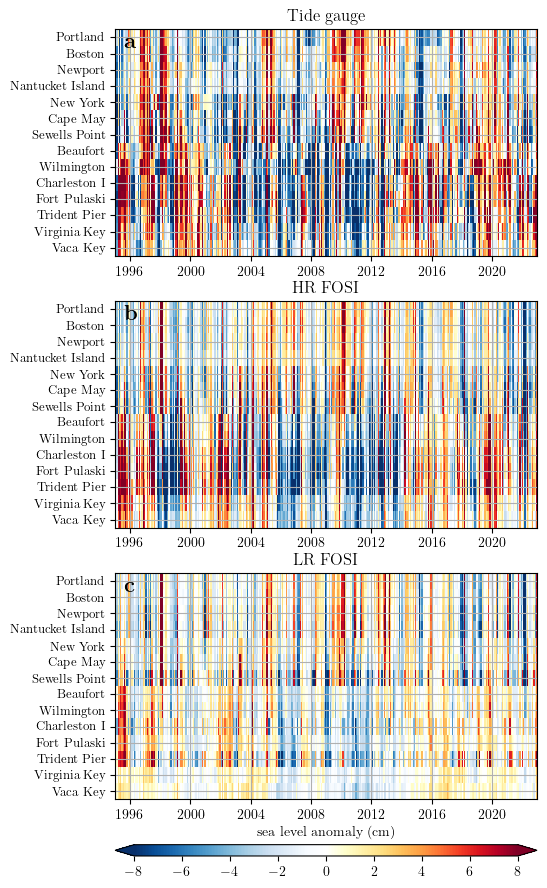

In [17]:
fig = plt.figure(figsize=(14,10))#, tight_layout=True)
plt.subplots_adjust(wspace=0.1, hspace=0.2)

nsim=1
cmap = mycolors.blue2red_cmap(20)
# cmap='Spectral_r'
ylabspacing = 1

vmin = -8
vmax2 = -vmin

for nsim in np.arange(3):
    if nsim<1:
        plotvar=xr_tg
        titstr="Tide gauge"
    else:
        if nsim<2:
            plotvar=hr_tg
            titstr="HR FOSI"
        else:
            plotvar=lr_tg
            titstr="LR FOSI"

    ax1 = plt.subplot2grid((3,5), (nsim, 1), colspan=2, rowspan=1)

    filled1 = ax1.pcolormesh(
        xr_tg.time,
        np.arange(0, len(tgnames), 1),
        plotvar.T,
        vmin=vmin,
        vmax=vmax2,
        cmap=cmap,
        shading="nearest",
    )
    plt.figtext(0.02, .9, r"$\bf{" + panellabs[nsim] + '' "}$" , horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=16, transform=ax1.transAxes)
    # ticks = np.arange(1.5, len(tgnames)+.5, ylabspacing)
# labels = tgnames[np.arange(1, len(tgnames), ylabspacing)]
# ax2.yaxis.set_ticks(ticks, labels=labels)    # plt.xlim([1000,1060])
    ticks = np.arange(0, len(tgnames), ylabspacing)
    if nsim<5:
        labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
    else:
        labels = []
    ax1.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
    plt.title(titstr)
    plt.ylim([-.5, len(tgnames)-.5])
    plt.grid()
    pos = ax1.get_position()  # get the original position
    
    if nsim>1:
        cbar_ax = fig.add_axes(
            [pos.x0, pos.y0-(pos.y1 - pos.y0)/4, (pos.x1-pos.x0), (pos.y1 - pos.y0)/20]
        )
        cbar = fig.colorbar(filled1, orientation="horizontal", cax=cbar_ax, extend="both",ticklocation='bottom')
        cbar.ax.set_title("sea level anomaly (cm)", rotation=0, size=10, weight="bold")
        cbar.ax.tick_params(labelsize=10)

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/2725563618.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
/glade/derecho/scratch/clittle/tmp/ipykernel_45311/2725563618.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]


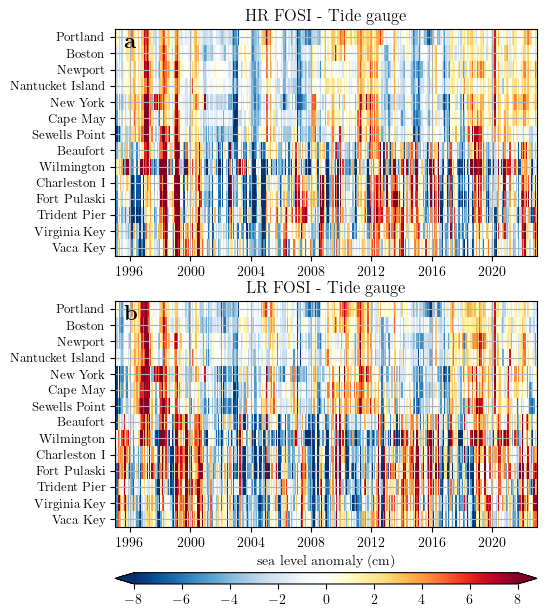

In [18]:
fig = plt.figure(figsize=(14,10))#, tight_layout=True)
plt.subplots_adjust(wspace=0.1, hspace=0.2)

nsim=1
cmap = mycolors.blue2red_cmap(20)
# cmap='Spectral_r'
ylabspacing = 1

vmin = -8
vmax2 = -vmin

for nsim in np.arange(2):
    if nsim<1:
        plotvar=xr_tg-hr_tg
        titstr="HR FOSI - Tide gauge"
    else:
        if nsim<2:
            plotvar=xr_tg-lr_tg
            titstr="LR FOSI - Tide gauge"
        else:
            plotvar=lr_tg
            titstr="LR FOSI"

    ax1 = plt.subplot2grid((3,5), (nsim, 1), colspan=2, rowspan=1)

    filled1 = ax1.pcolormesh(
        xr_tg.time,
        np.arange(0, len(tgnames), 1),
        plotvar.T,
        vmin=vmin,
        vmax=vmax2,
        cmap=cmap,
        shading="nearest",
    )
    plt.figtext(0.02, .9, r"$\bf{" + panellabs[nsim] + '' "}$" , horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=16, transform=ax1.transAxes)
    # ticks = np.arange(1.5, len(tgnames)+.5, ylabspacing)
# labels = tgnames[np.arange(1, len(tgnames), ylabspacing)]
# ax2.yaxis.set_ticks(ticks, labels=labels)    # plt.xlim([1000,1060])
    ticks = np.arange(0, len(tgnames), ylabspacing)
    if nsim<5:
        labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
    else:
        labels = []
    ax1.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
    plt.title(titstr)
    plt.ylim([-.5, len(tgnames)-.5])
    plt.grid()
    pos = ax1.get_position()  # get the original position
    
    if nsim>0:
        cbar_ax = fig.add_axes(
            [pos.x0, pos.y0-(pos.y1 - pos.y0)/4, (pos.x1-pos.x0), (pos.y1 - pos.y0)/20]
        )
        cbar = fig.colorbar(filled1, orientation="horizontal", cax=cbar_ax, extend="both",ticklocation='bottom')
        cbar.ax.set_title("sea level anomaly (cm)", rotation=0, size=10, weight="bold")
        cbar.ax.tick_params(labelsize=10)

## Calculate monthly EOFs and define plot fxns

In [137]:
kwargs = dict(n_modes=len(xr_tg.T)-1,random_state=2)#, normalize=True)
expvar_eofs=[]
expvar_lfcs=[]
expvar_lfcs2=[]
pcs=[]
eofs=[]
rec_eof_ts=[]
rec_lfp_ts=[]
da_w_m1=[]
lfcs=[]
lfps=[]
phases=[]
lf_tss=[]
# recvar=[]
# real_ts=[]
cuts=[36]
cutoff=cuts[0]
truncation=3
nmodes=truncation
rec_lfp=np.tile(xr_tg.values[np.newaxis,:, :]*0, [nmodes,1,1])
rec_eof=np.tile(xr_tg.values[np.newaxis,:, :]*0, [nmodes,1,1])
rec_var=rec_lfp[:,0,:]
rec_vars=[]

for nsim in np.arange(3):
    if nsim<1:
        dain=xr_tg
    else:
        if nsim<2:
            dain=hr_tg
        else:
            dain=lr_tg
            
    lfc, lfp, weights, r, pvar, pc, eof, ntr, pvar_slow, pvar_lfc, r_eofs, pvar_slow_eofs, lf_ts = tg_lfca(dain, cutoff, truncation)
    expvar_lfc = pvar_slow #fraction of total SSH variance
    expvar_lfc2 = pvar_lfc #fraction of total SSH variance
    # lfp=lfp[np.argsort(-expvar_lfc),:]
    # lfc=lfc[:,np.argsort(-expvar_lfc)]
    # expvar_lfc=expvar_lfc[np.argsort(-expvar_lfc)]
    expvar_eof = pvar
    rec_eof=np.tile(xr_tg.values[np.newaxis,:, :]*0, [nmodes,1,1])
    
    for nmode in np.arange(nmodes):
        rec_eof[nmode,:,:]=np.outer(pc[:,nmode],eof[nmode,:])
        rec_lfp[nmode,:,:]=np.outer(lfc[:,nmode],lfp[nmode,:])
        # diag_pear_coef = [sp.stats.pearsonr(rec_lfp[nmode,:, i], lf_ts[:, i])[0] for i in range(rec_lfp.T.shape[0])]
        # diag_pear_coef = [sp.stats.pearsonr(rec_eof[nmode,:, i], dain[:, i])[0] for i in range(rec_lfp.T.shape[0])]
        # ve=(np.array(diag_pear_coef)) #**2)
        # rec_var[nmode,:]=ve
    
    da_w_m1.append(dain)
    expvar_eofs.append(expvar_eof)
    expvar_lfcs.append(expvar_lfc)
    expvar_lfcs2.append(expvar_lfc2)
    # real_ts.append(dain)
    rec_vars.append(rec_var)
    pcs.append(pc)
    lfcs.append(lfc)
    eofs.append(eof)
    lfps.append(lfp)
    lf_tss.append(lf_ts)
    rec_eof_ts.append(rec_eof)
    rec_lfp_ts.append(rec_lfp)

In [138]:
def plot_obs_pcs(tgpcs,eofsin,expvar,expvar2,rec_eofs,vmaxin, varscale,nsim):
    fig = plt.figure(figsize=(15,13))#, tight_layout=True)
    plt.subplots_adjust(wspace=0.1, hspace=0.2)
    
    cmap = 'plasma'
    cmap = mycolors.blue2red_cmap(20)
    ylabspacing = 2
    
    vmin = -vmaxin
    vmax = -vmin

    for nmode in np.arange(len(lfps[0])):
        ax = plt.subplot2grid((5,len(lfps[0])), (1, nmode), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
        pos = ax.get_position() # get the original position 

        tt=rec_eof_ts[nsim][nmode,:,:]+xr_tg*0
        ccoef=xr.corr(tt,xr_tg,'time')**2
        # if nmode<1:    
        #     VE=recs_m1[nsim].var(dim='time')/tot_var
        # else:
        #     if nmode<2:    
        #         VE=recs_m2[nsim].var(dim='time')/tot_var
        #     else:
        #         VE=recs_m3[nsim].var(dim='time')/tot_var
                
        filled1 = plt.scatter(
            x=tgs_in.lon,
            y=tgs_in.lat,
            vmin=vmin,
            vmax=vmax,
            c=eofsin[nsim][nmode,:],
            cmap=cmap,  # this is the changes
            s=varscale*ccoef,
            alpha=1,
            edgecolors="k",
            linewidth=1,
            # marker=None,
            zorder=7,
            transform=xccrs.PlateCarree(),
        )  ## Important
        
        for nkey in np.arange(2):
            varval=varscale*(.25+.5*nkey)
            
            varkey = plt.scatter(
                x=tgs_in.lon,
                y=tgs_in.lat,
                vmin=vmin,
                vmax=vmax,
                c=eofsin[nsim][nmode,:]*0,
                cmap=cmap,  # this is the changes
                s=varval,
                alpha=1,
                edgecolors=".6",
                linewidth=1,
                # marker=None,
                zorder=7,
                transform=xccrs.PlateCarree(),
            )  ## Important
            
            varkey.set_facecolor("none")   
        
        ax.set_extent([-90, -78, 20, 48], crs=xccrs.PlateCarree())        
        ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
        ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
        ax.add_feature(cfeature.LAKES,zorder=3)

        ax.coastlines(zorder=5)
        ax.gridlines()

        if nmode<1:
            cbar_ax = fig.add_axes(
                [pos.x0+(pos.x1 - pos.x0)/4, pos.y0+(pos.y1 - pos.y0)/4, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
            )
            cbar = fig.colorbar(filled1, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
            cbar.ax.set_title("EOF (cm/SD)", rotation=0, size=10, weight="bold")
            cbar.ax.tick_params(labelsize=10)
                
        # ax.text(.02,.95, 'PC' + str(nsp+1) + ' lags by ' + str(lagx) + ' months' , transform=ax.transAxes, fontsize=12, weight='bold')
        # plt.figtext(-110,-40, "LF VE. = {:.0}".format(VE[nsp]), horizontalalignment='right', verticalalignment='center', fontsize=16, transform=ax.transAxes)
        # plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + 'EOF'+str(nmode+1), horizontalalignment='left', 
        plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + '', horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)
        plt.figtext(0.02, .04, ''+'{0:.0f}'.format(expvar_eofs[nsim][nmode])+"\%", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)  

    # import matplotlib.dates as mdates
    ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
    for nsp in np.arange(2):
        line = ax.plot(xr_tg.time,tgpcs[nsim][:,nsp],cols[nsp], label = 'data')
    # line = ax.plot(xr_tg.time,gmsl_norm,cols[2], label = 'data')

    plt.grid()
    plt.ylabel('Normalized PC')
    ax.legend([],     # The line objects
           labels=["TG PC1","TG PC2"],   # The labels for each line
           loc="upper right",   # Position of legend
           borderaxespad=0.4,    # Small spacing around legend box
           title="",
           fontsize=12,# Title for the legend
             )
    plt.figtext(0.02, .86, r"$\bf{" + panellabs[3] + '' "}$", horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)



In [139]:
def plot_pcs_m1(tgpcs,eofsin,expvar,expvar2,rec_eofs,vmaxin, varscale):
    fig = plt.figure(figsize=(15,13))#, tight_layout=True)
    plt.subplots_adjust(wspace=0.1, hspace=0.2)

    cmap = 'plasma'
    cmap = mycolors.blue2red_cmap(20)
    ylabspacing = 2
    nmode=0
    vmin = -vmaxin
    vmax = -vmin

    for nsim in np.arange(3):
        ax = plt.subplot2grid((5,3), (1, nsim), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
        pos = ax.get_position() # get the original position 

        tt=rec_eof_ts[nsim][nmode,:,:]+xr_tg*0
        ccoef=xr.corr(tt,da_w_m1[nsim],'time')**2
        # if nmode<1:    
        #     VE=recs_m1[nsim].var(dim='time')/tot_var
        # else:
        #     if nmode<2:    
        #         VE=recs_m2[nsim].var(dim='time')/tot_var
        #     else:
        #         VE=recs_m3[nsim].var(dim='time')/tot_var
                
        filled1 = plt.scatter(
            x=tgs_in.lon,
            y=tgs_in.lat,
            vmin=vmin,
            vmax=vmax,
            c=eofsin[nsim][nmode,:],
            cmap=cmap,  # this is the changes
            s=varscale*ccoef,
            alpha=1,
            edgecolors="k",
            linewidth=1,
            # marker=None,
            zorder=7,
            transform=xccrs.PlateCarree(),
        )  ## Important
        
        for nkey in np.arange(2):
            varval=varscale*(.25+.5*nkey)
            
            varkey = plt.scatter(
                x=tgs_in.lon,
                y=tgs_in.lat,
                vmin=vmin,
                vmax=vmax,
                c=eofsin[nsim][nmode,:]*0,
                cmap=cmap,  # this is the changes
                s=varval,
                alpha=1,
                edgecolors=".6",
                linewidth=1,
                # marker=None,
                zorder=7,
                transform=xccrs.PlateCarree(),
            )  ## Important
            
            varkey.set_facecolor("none")   
        
        ax.set_extent([-90, -78, 20, 48], crs=xccrs.PlateCarree())        
        ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
        ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
        ax.add_feature(cfeature.LAKES,zorder=3)

        ax.coastlines(zorder=5)
        ax.gridlines()

        if nmode<1:
            cbar_ax = fig.add_axes(
                [pos.x0+(pos.x1 - pos.x0)/4, pos.y0+(pos.y1 - pos.y0)/4, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
            )
            cbar = fig.colorbar(filled1, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
            cbar.ax.set_title("EOF (cm/SD)", rotation=0, size=10, weight="bold")
            cbar.ax.tick_params(labelsize=10)
                
        # ax.text(.02,.95, 'PC' + str(nsp+1) + ' lags by ' + str(lagx) + ' months' , transform=ax.transAxes, fontsize=12, weight='bold')
        # plt.figtext(-110,-40, "LF VE. = {:.0}".format(VE[nsp]), horizontalalignment='right', verticalalignment='center', fontsize=16, transform=ax.transAxes)
        # plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + 'EOF'+str(nmode+1), horizontalalignment='left', 
        plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + '', horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)
        plt.figtext(0.02, .04, ''+'{0:.0f}'.format(expvar_eofs[nsim][nmode])+"\%", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)

    # import matplotlib.dates as mdates
    ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
    for nsim in np.arange(3):
        line = ax.plot(xr_tg.time,tgpcs[nsim][:,nmode],cols[nsim], label = 'data')
    # line = ax.plot(xr_tg.time,gmsl_norm,cols[2], label = 'data')
        if nsim>0:
            tt=np.corrcoef(tgpcs[nsim][nmode,:],tgpcs[0][nmode,:])
            if nsim<2:
                ax.text(.25,.83, '$r=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
                    transform=ax.transAxes, fontsize=14, weight='bold',color='C1')
            else:
                ax.text(.25,.73, '$r=$'+str('{0:.2f}'.format(-tt[0,1])),#+', ',
                transform=ax.transAxes, fontsize=14, weight='bold',color='C0') 
    plt.grid()
    plt.ylabel('Normalized PC')
    ax.legend([],     # The line objects
           labels=["TG PC1","HR PC1","LR PC1"],   # The labels for each line
           loc="upper right",   # Position of legend
           borderaxespad=0.4,    # Small spacing around legend box
           title="",
           fontsize=12,# Title for the legend
             )
    plt.figtext(0.02, .86, r"$\bf{" + panellabs[3] + '' "}$", horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)



/glade/derecho/scratch/clittle/tmp/ipykernel_45311/419429222.py:95: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


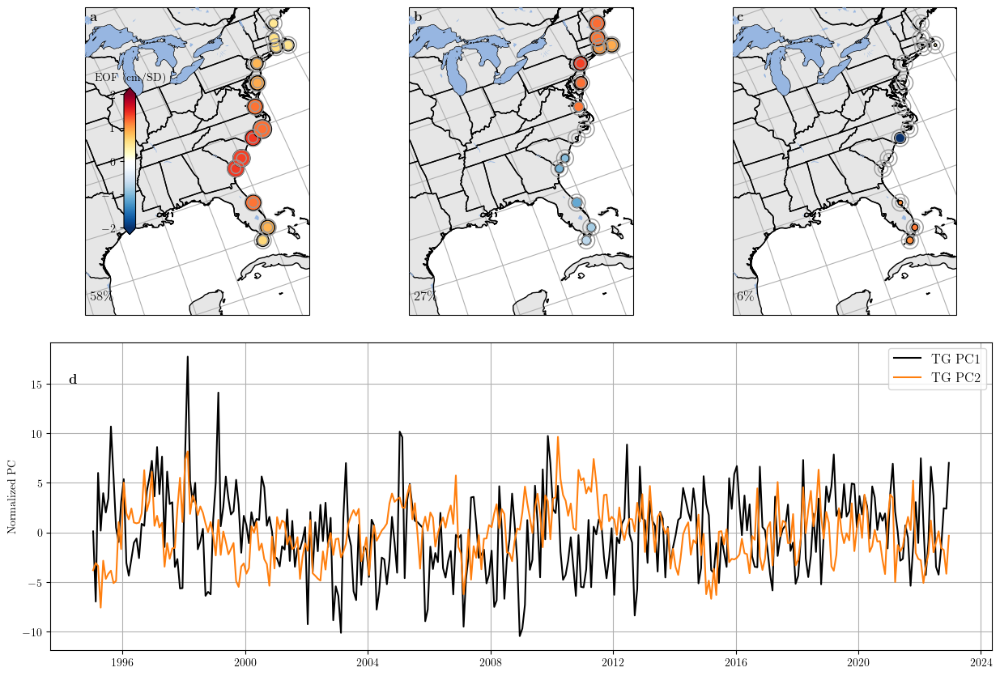

In [140]:
plot_obs_pcs(pcs,eofs,expvar_eofs,expvar_eofs,rec_eof_ts,2, 300, 0)#amps[nsim][0:2,:].max())
## limit to modes > 10% of LF. Or just #1 and #2.
## looking for coherent *non-linear* variability.

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/911600679.py:102: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


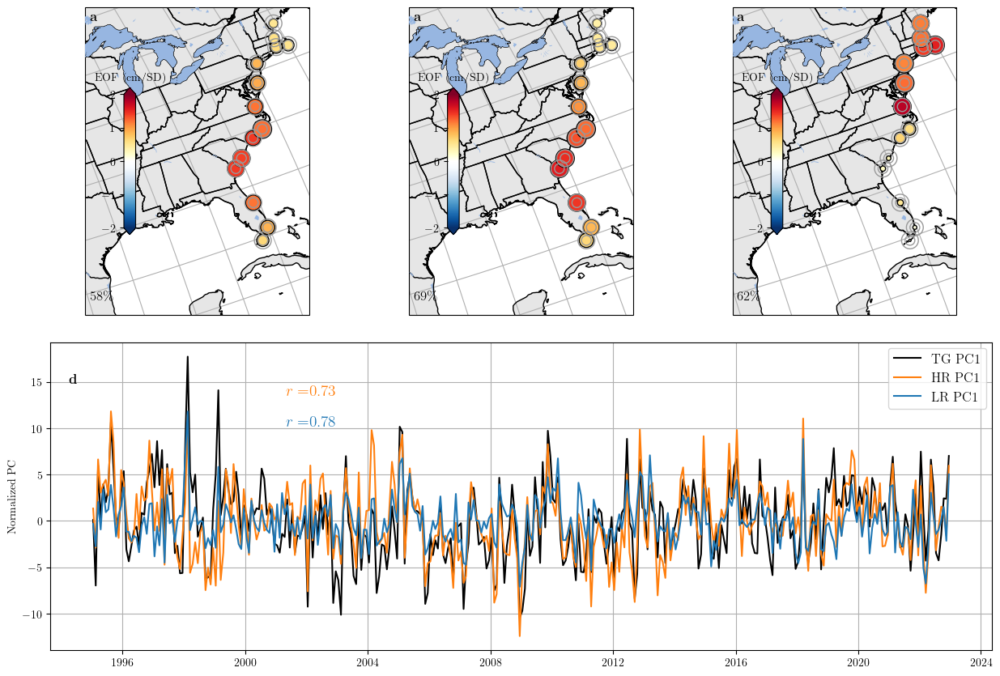

In [141]:
plot_pcs_m1(pcs,eofs,expvar_eofs,expvar_eofs,rec_eof_ts,2, 300)#amps[nsim][0:2,:].max())
## limit to modes > 10% of LF. Or just #1 and #2.
## looking for coherent *non-linear* variability.

In [142]:
#2. Fact that they are well-correlated allows the removal of each from each model/obs.
# Then characterize non-coastal wave variabiliy. Look at lower frequencies.

## Remove mode 1 from monthly time series

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/3583844870.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]


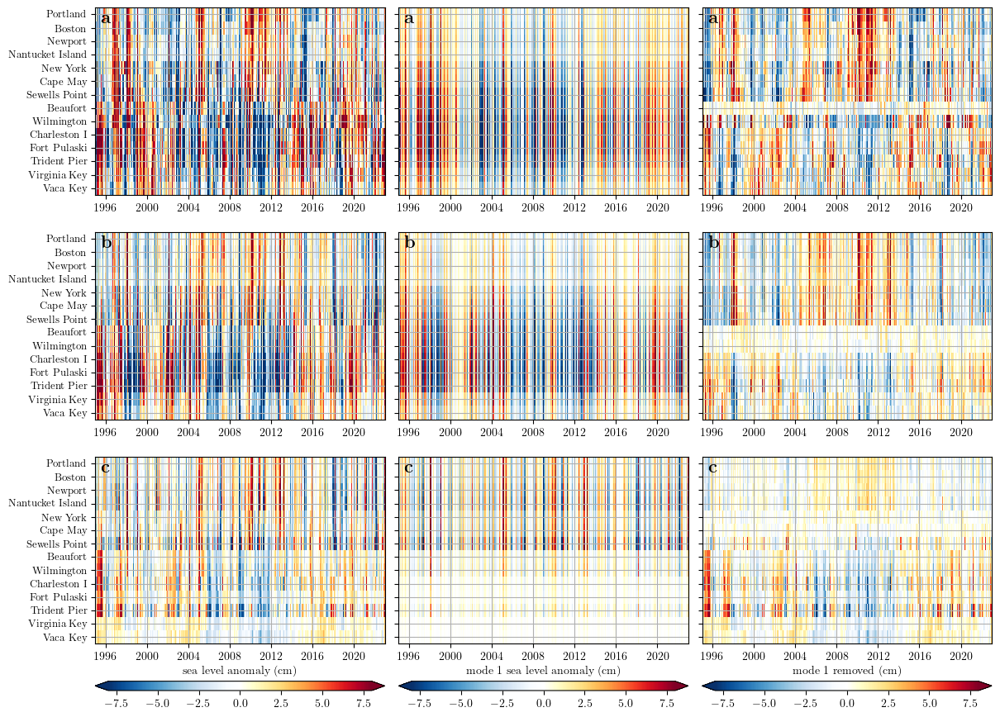

In [143]:
fig = plt.figure(figsize=(14,10))#, tight_layout=True)
plt.subplots_adjust(wspace=0.1, hspace=0.2)

nsim=1
cmap = mycolors.blue2red_cmap(20)
# cmap='Spectral_r'
ylabspacing = 1

vmin = -8
vmax2 = -vmin
da_rem_m1=da_w_m1.copy()

for ncol in np.arange(3):
    for nsim in np.arange(3):
        if ncol<1:
            plotvar=da_w_m1[nsim]
        else:
            if ncol<2:
                plotvar=rec_eof_ts[nsim][0,:,:]   
            else:            
                da_rem_m1[nsim]=da_w_m1[nsim]-rec_eof_ts[nsim][0,:,:]  
                plotvar=da_rem_m1[nsim]
            
        ax1 = plt.subplot2grid((3,6), (nsim, ncol*2), colspan=2, rowspan=1)
    
        filled1 = ax1.pcolormesh(
            xr_tg.time,
            np.arange(0, len(tgnames), 1),
            plotvar.T,
            vmin=vmin,
            vmax=vmax2,
            cmap=cmap,
            shading="nearest",
        )
        plt.figtext(0.02, .9, r"$\bf{" + panellabs[nsim] + '' "}$" , horizontalalignment='left', 
                        verticalalignment='bottom', fontsize=16, transform=ax1.transAxes)
        # ticks = np.arange(1.5, len(tgnames)+.5, ylabspacing)
    # labels = tgnames[np.arange(1, len(tgnames), ylabspacing)]
    # ax2.yaxis.set_ticks(ticks, labels=labels)    # plt.xlim([1000,1060])
        ticks = np.arange(0, len(tgnames), ylabspacing)
        if ncol<1:
            labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
        else:
            labels = []
        ax1.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
        # plt.title(titstr)
        plt.ylim([-.5, len(tgnames)-.5])
        plt.grid()
        pos = ax1.get_position()  # get the original position
        
        if nsim>1:
            cbar_ax = fig.add_axes(
                [pos.x0, pos.y0-(pos.y1 - pos.y0)/4, (pos.x1-pos.x0), (pos.y1 - pos.y0)/20]
            )
            cbar = fig.colorbar(filled1, orientation="horizontal", cax=cbar_ax, extend="both",ticklocation='bottom')
            if ncol<1:
                cbar.ax.set_title("sea level anomaly (cm)", rotation=0, size=10, weight="bold")
            else:
                if ncol<2:
                    cbar.ax.set_title("mode 1 sea level anomaly (cm)", rotation=0, size=10, weight="bold")
                else:
                    cbar.ax.set_title("mode 1 removed (cm)", rotation=0, size=10, weight="bold")

            cbar.ax.tick_params(labelsize=10)

In [26]:
# very clear dipole in the residual!

In [103]:
# fig = plt.figure(figsize=(14,10))#, tight_layout=True)
# plt.subplots_adjust(wspace=0.1, hspace=0.2)

# nsim=1
# cmap = mycolors.blue2red_cmap(20)
# # cmap='Spectral_r'
# ylabspacing = 1

# vmin = -8
# vmax2 = -vmin

# for nsim in np.arange(3):
#     if nsim<1:
#         titstr="HR FOSI - Tide gauge"
#         plotvar=da_rem_m1[nsim+1]-da_rem_m1[0]
#     else:
#         if nsim<2:
#             titstr="LR FOSI - Tide gauge"
#             plotvar=da_rem_m1[nsim+1]-da_rem_m1[0]
#         else:
#             plotvar=da_rem_m1[1]-da_rem_m1[2]
#             titstr="HR FOSI -LR FOSI"

#     ax1 = plt.subplot2grid((3,5), (nsim, 1), colspan=2, rowspan=1)

#     filled1 = ax1.pcolormesh(
#         xr_tg.time,
#         np.arange(0, len(tgnames), 1),
#         plotvar.T,
#         vmin=vmin,
#         vmax=vmax2,
#         cmap=cmap,
#         shading="nearest",
#     )
#     plt.figtext(0.02, .9, r"$\bf{" + panellabs[nsim] + '' "}$" , horizontalalignment='left', 
#                     verticalalignment='bottom', fontsize=16, transform=ax1.transAxes)
#     # ticks = np.arange(1.5, len(tgnames)+.5, ylabspacing)
# # labels = tgnames[np.arange(1, len(tgnames), ylabspacing)]
# # ax2.yaxis.set_ticks(ticks, labels=labels)    # plt.xlim([1000,1060])
#     ticks = np.arange(0, len(tgnames), ylabspacing)
#     if nsim<5:
#         labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
#     else:
#         labels = []
#     ax1.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
#     plt.title(titstr)
#     plt.ylim([-.5, len(tgnames)-.5])
#     plt.grid()
#     pos = ax1.get_position()  # get the original position
    
#     if nsim>0:
#         cbar_ax = fig.add_axes(
#             [pos.x0, pos.y0-(pos.y1 - pos.y0)/4, (pos.x1-pos.x0), (pos.y1 - pos.y0)/20]
#         )
#         cbar = fig.colorbar(filled1, orientation="horizontal", cax=cbar_ax, extend="both",ticklocation='bottom')
#         cbar.ax.set_title("sea level anomaly (cm)", rotation=0, size=10, weight="bold")
#         cbar.ax.tick_params(labelsize=10)

## Altimetry analysis

In [28]:
datadir = '/glade/work/clittle/altimetry/MEASURES/monthly/'
alt=xr.open_mfdataset(datadir+'monthly*.nc')
alt=alt*100
alt=alt.rename({'Time': 'time','Longitude':'lon','Lon_bounds':'lon_b','Latitude':'lat','Lat_bounds':'lat_b'})
alt = alt.drop(['lon_b','lat_b'])
ds_alt=alt.sel(time=slice('1995-01-01', '2023-01-01'))
gmsl = xr.open_dataset("../NSF-OCE_2148596/notebooks/USEC_FOSI_rez_comp/gmsl_mo.nc")
gmsl=gmsl.sel(time=slice('1995-01-01', '2023-01-01'))#,Longitude=slice(xlo,xhi),Latitude=slice(ylo,yhi))
gmsl=gmsl.gmsl_variation/10

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/56329713.py:5: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  alt = alt.drop(['lon_b','lat_b'])


In [29]:
xlo=1550; xhi=2200; ylo=550; yhi=900;
da=ds_alt.SLA-gmsl
da=da.isel(lon=slice(xlo,xhi),lat=slice(ylo,yhi))#.sel(time=slice('1993-01-01','2019-1-1'))
da['time']=xr_tg.time

In [30]:
[da_alt, datrend]=detrend_deseason(da.load())

In [31]:
pvalc=.05
ds_bathy = xr.open_dataset('/glade/work/clittle/p2521/input/'+"/obs/GEBCO.nc")

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


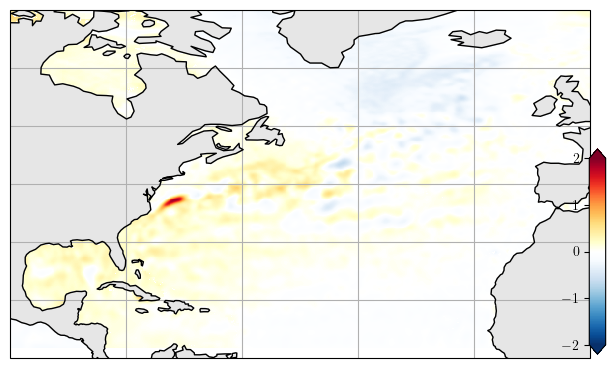

In [32]:
#altimetry trends
fig = plt.figure(figsize=(18,12), tight_layout=True)
vmin=-2
vmax=-vmin
cmap = mycolors.blue2red_cmap(20)

ax = plt.subplot2grid((1,3), (0, 0), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")

pos = ax.get_position() # get the original position 
ax.set_extent([-100, 0, 10, 70], crs=xccrs.PlateCarree())
im = ax.pcolormesh(da.lon,da.lat,datrend, shading='nearest', vmin=vmin, vmax=vmax, 
# im = ax.pcolormesh(lons, lats, altrc, shading='nearest', vmin=vmin, vmax=vmax, 
            cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    
cbar_ax = fig.add_axes(
    [pos.x1-(pos.x1 - pos.x0)/10, pos.y0+(pos.y1 - pos.y0)/10, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
)
cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
# cbar.ax.set_title("Reg. Coef. on PC" + str(nmode+1), rotation=0, size=10, weight="bold")
cbar.ax.tick_params(labelsize=10)
ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
# ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
ax.coastlines(zorder=5)
ax.gridlines()

* Aside from main analysis: Is the altimeter trend aliasing the recent SEUS rise and the GS path? Or is that a lower-frequency element?

In [33]:
def plot_ssh_reg(pcsin,SSH, lagx, coast_reg=True):
    fig = plt.figure(figsize=(12,6), tight_layout=True)
    vmin=-3
    vmax=-vmin
    regcoefs=[]    
    cmap = mycolors.blue2red_cmap(20)
    
    for nsp in np.arange(1):
        for nsim in np.arange(3):
            lons=SSH[nsim].TLONG.fillna(0)
            lats=SSH[nsim].TLAT.fillna(0)
            tgpc=pcsin[nsim]
            # if nsim>0:
            #     pcsin=pcsin.T
            regressand=SSH[nsim]
            # regressand2=xr_tg.TG_IB_CORR
            # print(pcsin)
            focusts=regressand[:,0,0].fillna(0)*0+tgpc[:,nsp]
            cov,cor,slope,intercept,pval,stderr = lag_linregress_3D(x=focusts,y=regressand, lagx=lagx)
            altrc=slope+regressand[0,:,:]*0
            altpval=pval
            mask=1+0/(pval<pvalc)
            # focusts=regressand2.isel(tgindex=0).squeeze()*0+np.real(tgpcs[nsp,:])
            # cov,cor,slope,intercept,pval,stderr = lag_linregress_3D(x=focusts,y=regressand2, lagx=lagx)
            
            ax = plt.subplot2grid((1,3), (0, nsim), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")
            
            pos = ax.get_position() # get the original position 
            if coast_reg:
                ax.set_extent([-100, -60, 20, 52], crs=xccrs.PlateCarree())
            else:
                ax.set_extent([-100, 0, 10, 70], crs=xccrs.PlateCarree())
            im = ax.pcolormesh(lons,lats, mask*altrc, shading='nearest', vmin=vmin, vmax=vmax, 
            # im = ax.pcolormesh(lons, lats, altrc, shading='nearest', vmin=vmin, vmax=vmax, 
                        cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    

            CS2 = ax.contour(ds_bathy.depth.longitude ,ds_bathy.depth.latitude, -ds_bathy.depth,
                            np.arange(100,101,1),colors='.6',linewidths=2,zorder=2,transform=xccrs.PlateCarree())
            
            CS2 = ax.contour(ds_bathy.depth.longitude ,ds_bathy.depth.latitude, -ds_bathy.depth,
                           np.arange(1000,2000,1000),colors='.6',linewidths=1,zorder=2,transform=xccrs.PlateCarree())

            if nsp==0:
                cbar_ax = fig.add_axes(
                    [pos.x1-(pos.x1 - pos.x0)/10, pos.y0+(pos.y1 - pos.y0)/10, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
                )
                cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
                # cbar.ax.set_title("Reg. Coef. on PC" + str(nmode+1), rotation=0, size=10, weight="bold")
                cbar.ax.tick_params(labelsize=10)
                
            # if nsim<1:
            #     plt.figtext(.05, .95, 'Regression on HR PC'+str(nsp+1), horizontalalignment='left', verticalalignment='center', fontsize=20, transform=ax.transAxes)
            # else:
            #     plt.figtext(.05, .95, 'Regression on LR PC'+str(nsp+1), horizontalalignment='left', verticalalignment='center', fontsize=20, transform=ax.transAxes)
                            
            ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
            # ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
    
            ax.coastlines(zorder=5)
            ax.gridlines()
            regcoefs.append(altrc)
    return regcoefs
            # ax.text(.02,.95, 'PC' + str(nsp+1) + ' lags by ' + str(lagx) + ' months' , transform=ax.transAxes, fontsize=12, weight='bold')
    # return altrc

In [34]:
da_alt=da_alt.rename({'lat':'TLAT','lon':'TLONG'})
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_hr_ssh_det.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
ssh['time']=da_alt.time
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

dahr=ssh
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_lr_ssh_det.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

ssh['time']=da_alt.time
dalr=ssh

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


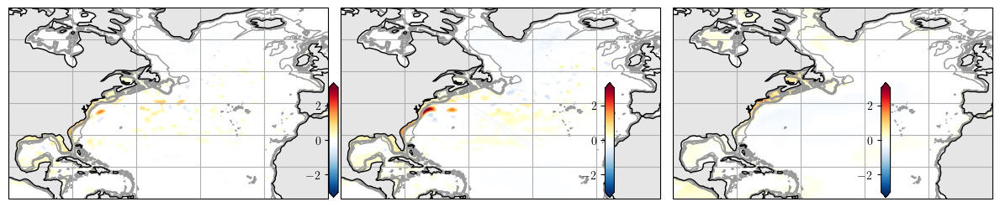

In [35]:
SSHs=[]
SSHs.append(da_alt)
SSHs.append(dahr)
SSHs.append(dalr)
regcoefs_m1=plot_ssh_reg(pcs,SSHs, 0, False)

* use regression to pull out offshore SSH variability assocaited with mode 1

In [36]:
## 
# tt=np.outer(regcoefs_m1[1],pcs[1][:,0])
SSHs_m1rem=[]

for nsim in np.arange(3):
    tt=regcoefs_m1[nsim][:,:].values
    tt=np.tile(tt[:,:,np.newaxis],[1,1,len(pcs[nsim][:,0])])
    tt=tt*pcs[nsim][:,0]
    tt=np.transpose(tt, (2, 0, 1))
    SSH_m1rem=SSHs[nsim]-tt
    SSHs_m1rem.append(SSH_m1rem)

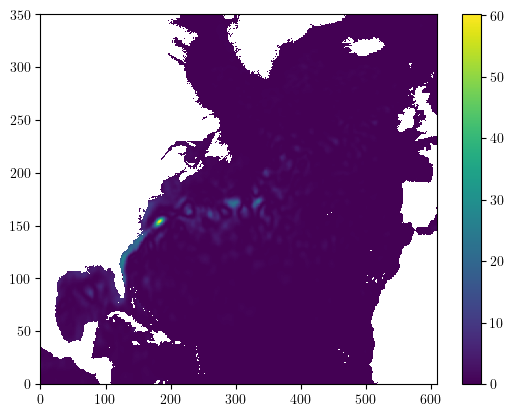

In [37]:
plt.pcolormesh(SSHs[0].var(dim='time')-SSHs_m1rem[0].var(dim='time'))
plt.colorbar()

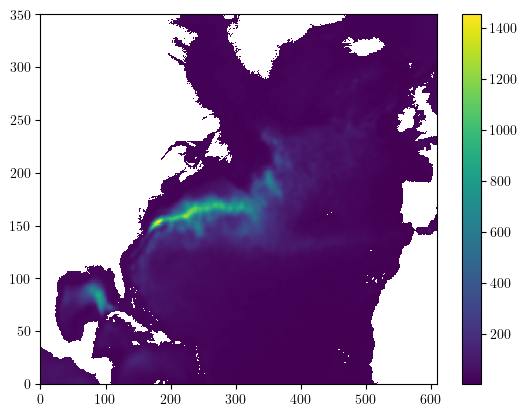

In [38]:
plt.pcolormesh(SSHs_m1rem[0].var(dim='time'))
plt.colorbar()

# part 1: what is the dipole mode and what is its resolution dependence?

## annual mean analysis

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/3475636098.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
/glade/derecho/scratch/clittle/tmp/ipykernel_45311/3475636098.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
/glade/derecho/scratch/clittle/tmp/ipykernel_45311/3475636098.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by pos

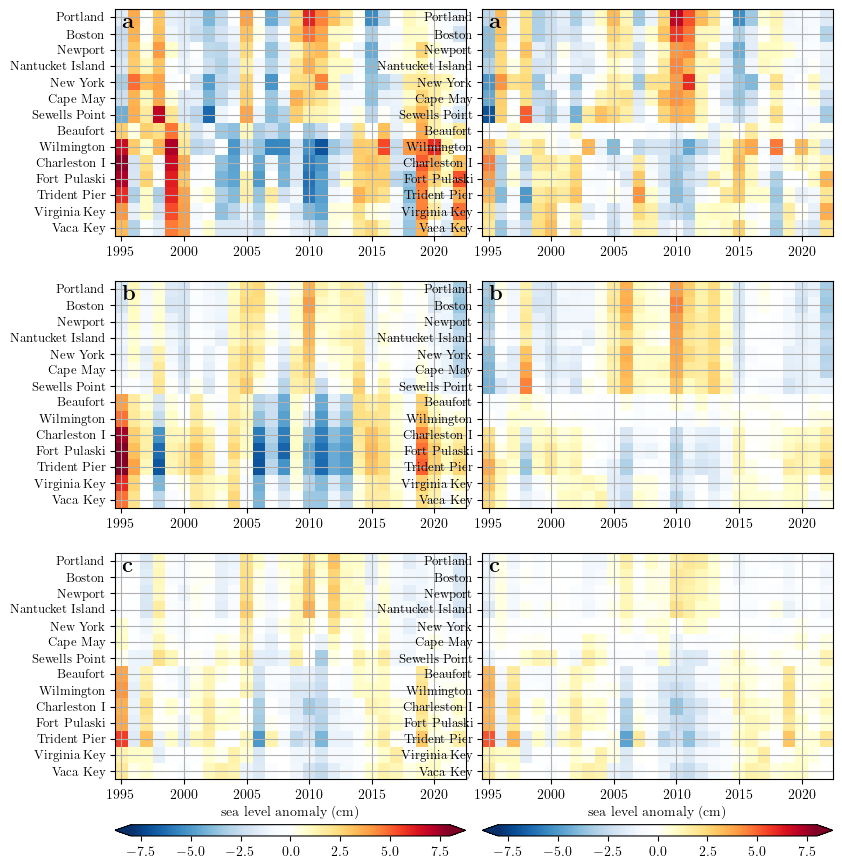

In [39]:
fig = plt.figure(figsize=(14,10))#, tight_layout=True)
plt.subplots_adjust(wspace=0.1, hspace=0.2)

nsim=1
cmap = mycolors.blue2red_cmap(20)
# cmap='Spectral_r'
ylabspacing = 1
da_rem_m1_anns=[]
vmin = -8
vmax2 = -vmin

for ncol in np.arange(2):
    for nsim in np.arange(3):
        if ncol<1:
            plotvar=da_w_m1[nsim].groupby('time.year').mean('time').rename({'year':'time'})
        else:
            if ncol<2:
                da_rem_m1_ann=da_rem_m1[nsim].groupby('time.year').mean('time').rename({'year':'time'})
                plotvar=da_rem_m1_ann
                da_rem_m1_anns.append(plotvar)
            else:            
                plotvar=da_w_m1[nsim].groupby('time.year').mean('time').rename({'year':'time'})-rec_eof_ts[nsim][0,:,:].groupby('time.year').mean('time').rename({'year':'time'})  
            
        ax1 = plt.subplot2grid((3,6), (nsim, ncol*2), colspan=2, rowspan=1)
    
        filled1 = ax1.pcolormesh(
            plotvar.time,
            np.arange(0, len(tgnames), 1),
            plotvar.T,
            vmin=vmin,
            vmax=vmax2,
            cmap=cmap,
            shading="nearest",
        )
        plt.figtext(0.02, .9, r"$\bf{" + panellabs[nsim] + '' "}$" , horizontalalignment='left', 
                        verticalalignment='bottom', fontsize=16, transform=ax1.transAxes)
        # ticks = np.arange(1.5, len(tgnames)+.5, ylabspacing)
    # labels = tgnames[np.arange(1, len(tgnames), ylabspacing)]
    # ax2.yaxis.set_ticks(ticks, labels=labels)    # plt.xlim([1000,1060])
        ticks = np.arange(0, len(tgnames), ylabspacing)
        if nsim<5:
            labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
        else:
            labels = []
        ax1.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
        # plt.title(titstr)
        plt.ylim([-.5, len(tgnames)-.5])
        plt.grid()
        pos = ax1.get_position()  # get the original position
        
        if nsim>1:
            cbar_ax = fig.add_axes(
                [pos.x0, pos.y0-(pos.y1 - pos.y0)/4, (pos.x1-pos.x0), (pos.y1 - pos.y0)/20]
            )
            cbar = fig.colorbar(filled1, orientation="horizontal", cax=cbar_ax, extend="both",ticklocation='bottom')
            cbar.ax.set_title("sea level anomaly (cm)", rotation=0, size=10, weight="bold")
            cbar.ax.tick_params(labelsize=10)
            

In [49]:
focustg1='234'
focustg2='1111'
# after wang/lee

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/1653593971.py:8: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


Text(0.4, 0.86, '$\\bf{Charleston I}$')

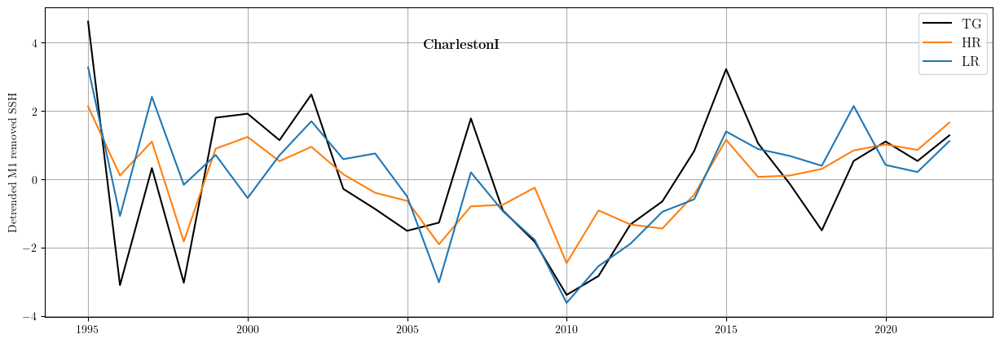

In [50]:
fig = plt.figure(figsize=(15,13))#, tight_layout=True)
ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
for nsim in np.arange(3):
    line = ax.plot(da_rem_m1_anns[nsim].time,da_rem_m1_anns[nsim].sel(tgindex=focustg1),cols[nsim], label = 'data')

plt.grid()
plt.ylabel('Detrended M1 removed SSH')
ax.legend([],     # The line objects
       labels=["TG","HR","LR"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=12,# Title for the legend
         )
plt.figtext(0.4, .86, r"$\bf{" + str(shortname[focustg1]) + '' "}$", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/1619182323.py:8: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


Text(0.4, 0.86, '$\\bf{Nantucket Island}$')

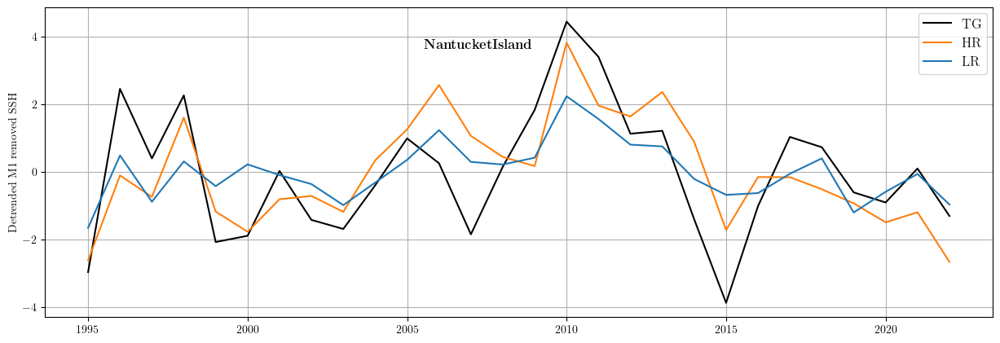

In [106]:
fig = plt.figure(figsize=(15,13))#, tight_layout=True)
ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
for nsim in np.arange(3):
    line = ax.plot(da_rem_m1_anns[nsim].time,da_rem_m1_anns[nsim].sel(tgindex=focustg2),cols[nsim], label = 'data')

plt.grid()
plt.ylabel('Detrended M1 removed SSH')
ax.legend([],     # The line objects
       labels=["TG","HR","LR"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=12,# Title for the legend
         )
plt.figtext(0.4, .86, r"$\bf{" + str(shortname[focustg2]) + '' "}$", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)

In [107]:
nao=xr.open_dataset('nao.long.nc')
nao=nao.sel(time=slice('1994-12-31','2022-12-31'))
nao_am=nao.value.groupby('time.year').mean('time').rename({'year':'time'})
nao_am=-nao_am/nao_am.std(dim='time')

In [108]:
def plot_obs_pcs2b(tgpcs,eofsin,expvar,expvar2,rec_eofs,vmaxin, varscale,nsim):
    fig = plt.figure(figsize=(15,13))#, tight_layout=True)
    plt.subplots_adjust(wspace=0.1, hspace=0.2)

    cmap = 'plasma'
    cmap = mycolors.blue2red_cmap(20)
    ylabspacing = 2
    
    vmin = -vmaxin
    vmax = -vmin
    nmode=0
    for nsim in np.arange(3):
        ax = plt.subplot2grid((5,3), (1, nsim), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
        pos = ax.get_position() # get the original position 

        tt=rec_eof_ts[nsim][nmode,:,:]+da_rem_m1_anns[nsim]*0
        ccoef=xr.corr(tt,da_rem_m1_anns[nsim])**2
        # if nmode<1:    
        #     VE=recs_m1[nsim].var(dim='time')/tot_var
        # else:
        #     if nmode<2:    
        #         VE=recs_m2[nsim].var(dim='time')/tot_var
        #     else:
        #         VE=recs_m3[nsim].var(dim='time')/tot_var
        if nsim>1:
            plotvar=-eofsin[nsim][nmode,:]
        else:
            plotvar=eofsin[nsim][nmode,:]
            
        filled1 = plt.scatter(
            x=tgs_in.lon,
            y=tgs_in.lat,
            vmin=vmin,
            vmax=vmax,
            c=plotvar,
            cmap=cmap,  # this is the changes
            s=varscale*ccoef,
            alpha=1,
            edgecolors="k",
            linewidth=1,
            # marker=None,
            zorder=7,
            transform=xccrs.PlateCarree(),
        )  ## Important
        
        for nkey in np.arange(2):
            varval=varscale*(.25+.5*nkey)
            
            varkey = plt.scatter(
                x=tgs_in.lon,
                y=tgs_in.lat,
                vmin=vmin,
                vmax=vmax,
                c=eofsin[nsim][nmode,:]*0,
                cmap=cmap,  # this is the changes
                s=varval,
                alpha=1,
                edgecolors=".6",
                linewidth=1,
                # marker=None,
                zorder=7,
                transform=xccrs.PlateCarree(),
            )  ## Important
            
            varkey.set_facecolor("none")   
        
        ax.set_extent([-90, -78, 20, 48], crs=xccrs.PlateCarree())        
        ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
        ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
        ax.add_feature(cfeature.LAKES,zorder=3)

        ax.coastlines(zorder=5)
        ax.gridlines()

        if nmode<1:
            cbar_ax = fig.add_axes(
                [pos.x0+(pos.x1 - pos.x0)/4, pos.y0+(pos.y1 - pos.y0)/4, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
            )
            cbar = fig.colorbar(filled1, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
            cbar.ax.set_title("EOF (cm/SD)", rotation=0, size=10, weight="bold")
            cbar.ax.tick_params(labelsize=10)
                
        # ax.text(.02,.95, 'PC' + str(nsp+1) + ' lags by ' + str(lagx) + ' months' , transform=ax.transAxes, fontsize=12, weight='bold')
        # plt.figtext(-110,-40, "LF VE. = {:.0}".format(VE[nsp]), horizontalalignment='right', verticalalignment='center', fontsize=16, transform=ax.transAxes)
        # plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + 'EOF'+str(nmode+1), horizontalalignment='left', 
        plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + '', horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)
        plt.figtext(0.02, .04, ''+'{0:.0f}'.format(expvar_eofs[nsim][nmode])+"\%", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)
   

    # import matplotlib.dates as mdates
    ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
    for nsim in np.arange(3):
        if nsim>1:
            plotvar=-tgpcs[nsim][:,0]
        else:
            plotvar=tgpcs[nsim][:,0]
        line = ax.plot(da_rem_m1_anns[nsim].time,plotvar,cols[nsim], label = 'data')
    line = ax.plot(da_rem_m1_anns[nsim].time,nao_am,'k--')
    plt.grid()
    plt.ylabel('Normalized PC')
    ax.legend([],     # The line objects
           labels=["TG","HR","LR","NAO"],   # The labels for each line
           loc="upper right",   # Position of legend
           borderaxespad=0.4,    # Small spacing around legend box
           title="",
           fontsize=12,# Title for the legend
             )
    plt.figtext(0.02, .86, r"$\bf{" + panellabs[3] + '' "}$", horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)



In [109]:
kwargs = dict(n_modes=len(xr_tg.T)-1,random_state=2)#, normalize=True)
expvar_eofs=[]
expvar_lfcs=[]
expvar_lfcs2=[]
pcs=[]
eofs=[]
rec_eof_ts=[]
rec_lfp_ts=[]
da_w_m1=[]
lfcs=[]
lfps=[]
phases=[]
lf_tss=[]
# recvar=[]
# real_ts=[]
cuts=[2]
cutoff=cuts[0]
truncation=6
nmodes=truncation
rec_lfp=np.tile(da_rem_m1_anns[nsim].values[np.newaxis,:, :]*0, [nmodes,1,1])
rec_var=rec_lfp[:,0,:]
rec_vars=[]
rec_eof=[]

for nsim in np.arange(3):
    dain=da_rem_m1_anns[nsim]
            
    lfc, lfp, weights, r, pvar, pc, eof, ntr, pvar_slow, pvar_lfc, r_eofs, pvar_slow_eofs, lf_ts = tg_lfca(dain, cutoff, truncation)
    expvar_lfc = pvar_slow #fraction of total SSH variance
    expvar_lfc2 = pvar_lfc #fraction of total SSH variance
    # lfp=lfp[np.argsort(-expvar_lfc),:]
    # lfc=lfc[:,np.argsort(-expvar_lfc)]
    # expvar_lfc=expvar_lfc[np.argsort(-expvar_lfc)]
    expvar_eof = pvar
    rec_eof=np.tile(da_rem_m1_anns[nsim].values[np.newaxis,:, :]*0, [nmodes,1,1])
    
    for nmode in np.arange(nmodes):
        rec_eof[nmode,:,:]=np.outer(pc[:,nmode],eof[nmode,:])
        rec_lfp[nmode,:,:]=np.outer(lfc[:,nmode],lfp[nmode,:])
        diag_pear_coef = [sp.stats.pearsonr(rec_lfp[nmode,:, i], lf_ts[:, i])[0] for i in range(rec_lfp.T.shape[0])]
        ve=(np.array(diag_pear_coef)) #**2)
        rec_var[nmode,:]=ve
    
    da_w_m1.append(dain)
    expvar_eofs.append(expvar_eof)
    expvar_lfcs.append(expvar_lfc)
    expvar_lfcs2.append(expvar_lfc2)
    # real_ts.append(dain)
    rec_vars.append(rec_var)
    pcs.append(pc)
    lfcs.append(lfc)
    eofs.append(eof)
    lfps.append(lfp)
    lf_tss.append(lf_ts)
    rec_eof_ts.append(rec_eof)
    rec_lfp_ts.append(rec_lfp)

In [110]:
norm_fac=pcs[0][:,0].std()

for nsim in np.arange(len(pcs)): 
    # total_var=real_ts[nsim].var(dim='time')
    pcs[nsim][:,0]=pcs[nsim][:,0]/norm_fac
    eofs[nsim][0,:]=eofs[nsim][0,:]*norm_fac
    # eofs[nsim]=eofs[nsim].T

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/3354388672.py:103: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


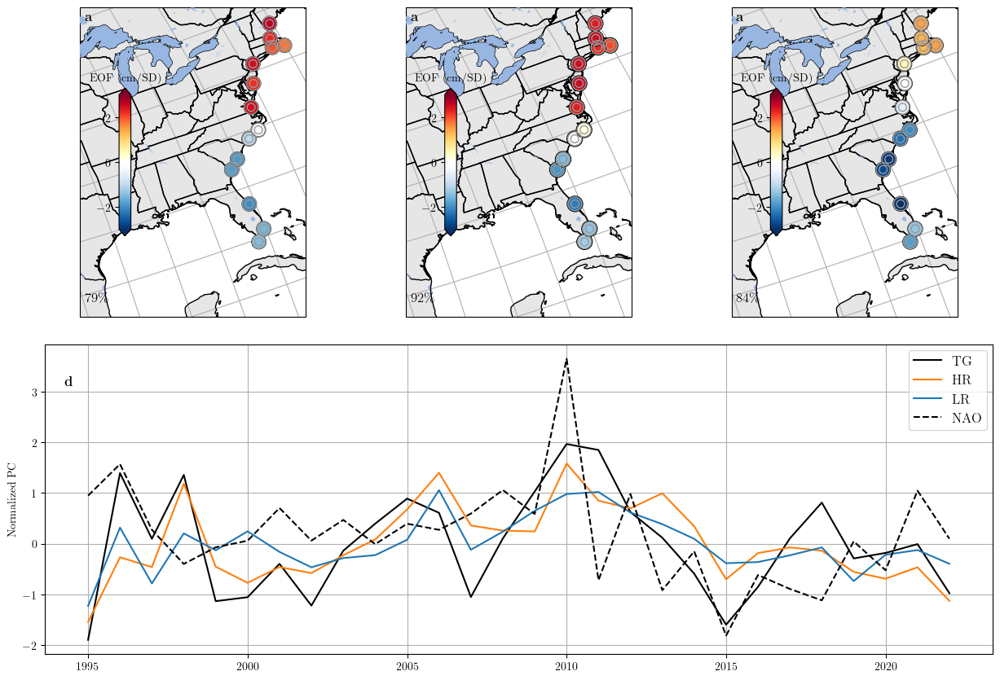

In [111]:
plot_obs_pcs2b(pcs,eofs,expvar_eofs,expvar_eofs,rec_eof_ts,3, 200, 0)#amps[nsim][0:2,:].max())
## limit to modes > 10% of LF. Or just #1 and #2.
## looking for coherent *non-linear* variability.

* annual mean leading EOFS, mode 1 monthly removed

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/2549766216.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]


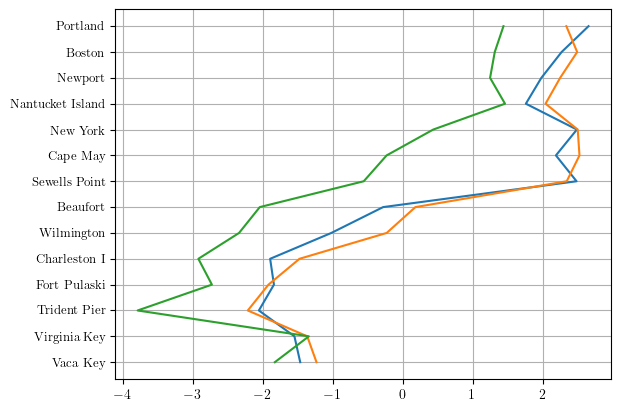

In [112]:
ax = plt.subplot2grid((1,1), (0,0), colspan=1, rowspan=1)    
plt.plot(eofs[0][0,:],np.arange(len(tgnames)))
plt.plot(eofs[1][0,:],np.arange(len(tgnames)))
plt.plot(-eofs[2][0,:],np.arange(len(tgnames)))
# plt.plot(eofs[1][0,:])
# plt.plot(-eofs[2][0,:])
# plt.plot(eofs[2][:,0]-eofs[0][:,0])
ticks = np.arange(0, len(tgnames), ylabspacing)
labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
ax.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
plt.grid()


In [118]:
def plot_ssh_reg2(tgpcs,SSH,tglons,tglats, lagx, coast_reg=True):
    fig = plt.figure(figsize=(18,12), tight_layout=True)
    vmin=-3
    vmax=-vmin
    
    cmap = mycolors.blue2red_cmap(20)
    
    for nsp in np.arange(1):
        for nsim in [1,2]:# np.arange(3):#[1,2]:# #:#
            pc2=tgpcs[nsim].T
            if nsim>1:
                pc2=-pc2
            # lagx=0
            lons=SSH[nsim].TLONG.fillna(0)
            lats=SSH[nsim].TLAT.fillna(0)
            tgpcs=tgpcs
            regressand=SSH[nsim] 
            # regressand2=xr_tg.TG_IB_CORR
                    
            focusts=regressand[:,0,0].fillna(0)*0+np.real(pc2[nsp,:])
            cov,cor,slope,intercept,pval,stderr = lag_linregress_3D(x=focusts,y=regressand, lagx=lagx)
            altrc=slope+regressand[0,:,:]*0
            altpval=pval
            mask=1+0/(pval<pvalc)
            # focusts=regressand2.isel(tgindex=0).squeeze()*0+np.real(tgpcs[nsp,:])
            # cov,cor,slope,intercept,pval,stderr = lag_linregress_3D(x=focusts,y=regressand2, lagx=lagx)
            
            ax = plt.subplot2grid((1,3), (0, nsim), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")
            
            pos = ax.get_position() # get the original position 
            if coast_reg:
                ax.set_extent([-83, -60, 20, 52], crs=xccrs.PlateCarree())
            else:
                ax.set_extent([-100, 0, 10, 70], crs=xccrs.PlateCarree())
            sign=np.sign(mask*altrc)
            # im = ax.pcolormesh(lons, lats, sign*np.log10(np.abs(mask*altrc)), shading='nearest', vmin=vmin, vmax=vmax, 
            im = ax.pcolormesh(lons, lats, mask*altrc, shading='nearest', vmin=vmin, vmax=vmax, 
            # im = ax.pcolormesh(lons, lats, altrc, shading='nearest', vmin=vmin, vmax=vmax, 
                        cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    

            CS2 = ax.contour(ds_bathy.depth.longitude ,ds_bathy.depth.latitude, -ds_bathy.depth,
                            np.arange(100,101,1),colors='.6',linewidths=2,zorder=2,transform=xccrs.PlateCarree())
            
            CS2 = ax.contour(ds_bathy.depth.longitude ,ds_bathy.depth.latitude, -ds_bathy.depth,
                           np.arange(1000,2000,1000),colors='.6',linewidths=1,zorder=2,transform=xccrs.PlateCarree())

            if nsp==0:
                cbar_ax = fig.add_axes(
                    [pos.x1-(pos.x1 - pos.x0)/10, pos.y0+(pos.y1 - pos.y0)/10, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
                )
                cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
                # cbar.ax.set_title("Reg. Coef. on PC" + str(nmode+1), rotation=0, size=10, weight="bold")
                cbar.ax.tick_params(labelsize=10)
                
            # if nsim<1:
            #     plt.figtext(.05, .95, 'Regression on HR PC'+str(nsp+1), horizontalalignment='left', verticalalignment='center', fontsize=20, transform=ax.transAxes)
            # else:
            #     plt.figtext(.05, .95, 'Regression on LR PC'+str(nsp+1), horizontalalignment='left', verticalalignment='center', fontsize=20, transform=ax.transAxes)
                            
            ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
            # ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
    
            ax.coastlines(zorder=5)
            ax.gridlines()
            # ax.text(.02,.95, 'PC' + str(nsp+1) + ' lags by ' + str(lagx) + ' months' , transform=ax.transAxes, fontsize=12, weight='bold')
    # return altrc

In [119]:
# IF NO REMOVAL!!

# da_ann=da_alt.groupby('time.year').mean('time').rename({'year':'time'})
# da_ann=da_ann.rename({'lat':'TLAT','lon':'TLONG'})
# ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_hr_ssh_det.nc')
# ssh=ssh.ssh.isel(time=slice(24,336+24))
# ssh['time']=da_alt.time
# # ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

# dahr=ssh.groupby('time.year').mean('time').rename({'year':'time'})#
# ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_lr_ssh_det.nc')
# ssh=ssh.ssh.isel(time=slice(24,336+24))
# # ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

# ssh['time']=da_alt.time
# dalr=ssh.groupby('time.year').mean('time').rename({'year':'time'})

In [120]:
# WITH REMOVAL from SSH field
da_ann=SSHs_m1rem[0].groupby('time.year').mean('time').rename({'year':'time'})
dahr=SSHs_m1rem[1].groupby('time.year').mean('time').rename({'year':'time'})
dalr=SSHs_m1rem[2].groupby('time.year').mean('time').rename({'year':'time'})

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


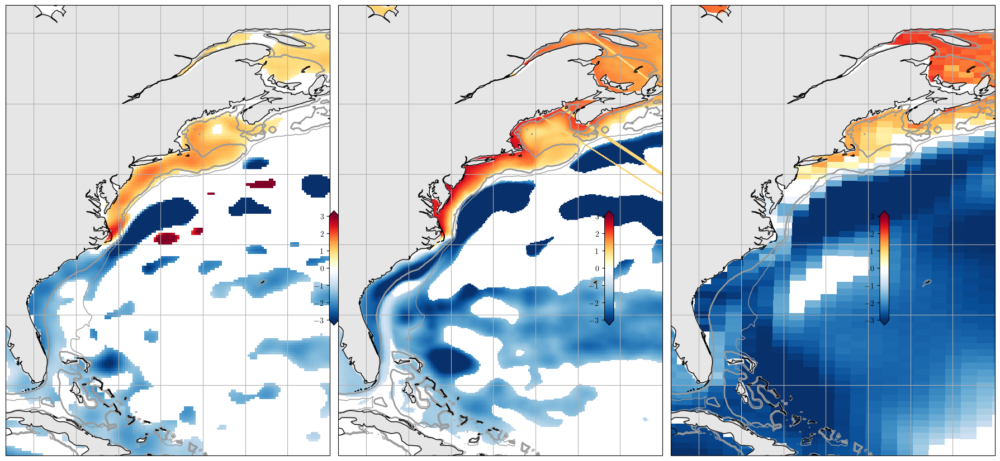

In [114]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, True)

* regression on annual mean leading EOFS, mode 1 monthly removed
* coast is probably better in HR than altimetry, since TG's look almost identical to HR?

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


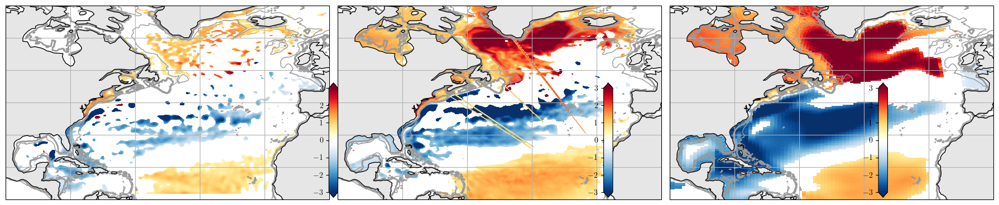

In [115]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, False)

## Regression of full simulation modes on Buoyancy-forced SSH

In [130]:
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_hr_ssh_b_det.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
ssh['time']=da_alt.time
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

dahr=ssh.groupby('time.year').mean('time').rename({'year':'time'})#

ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_lr_ssh_b.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

ssh['time']=da_alt.time
dalr=ssh.groupby('time.year').mean('time').rename({'year':'time'})

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


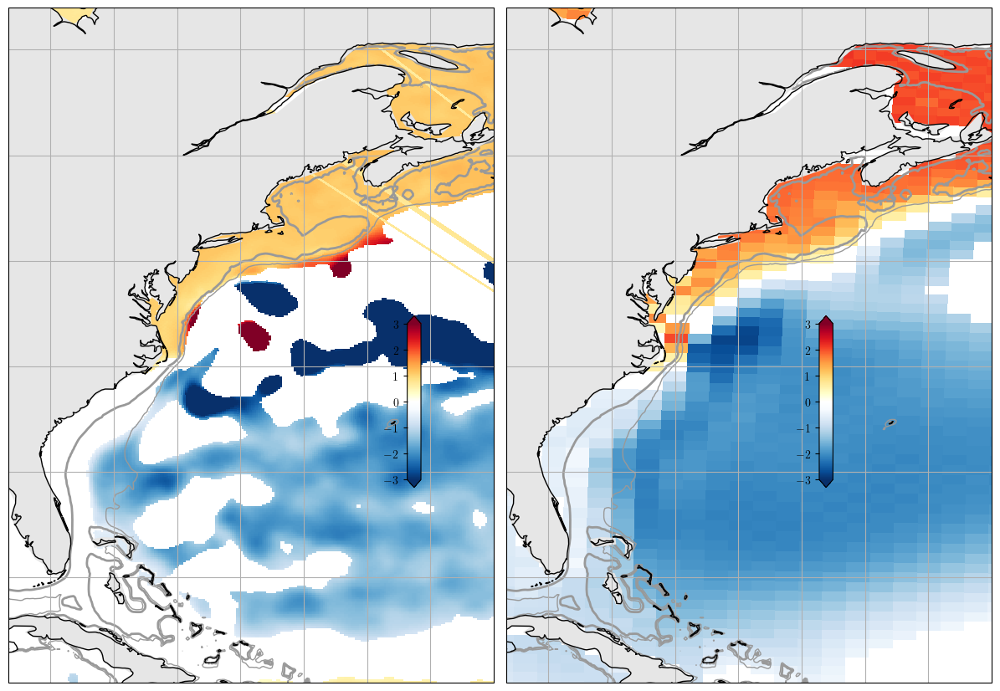

In [122]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, True)

In [123]:
## LR overcooked N of hatteras buoyancy response
# is the reason why response is enhanced in the North over centennial timescales (Li et al. 2022)?
## possibility of offsetting buoyancy-forced response in SAB from coastal and offshore pathways?

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


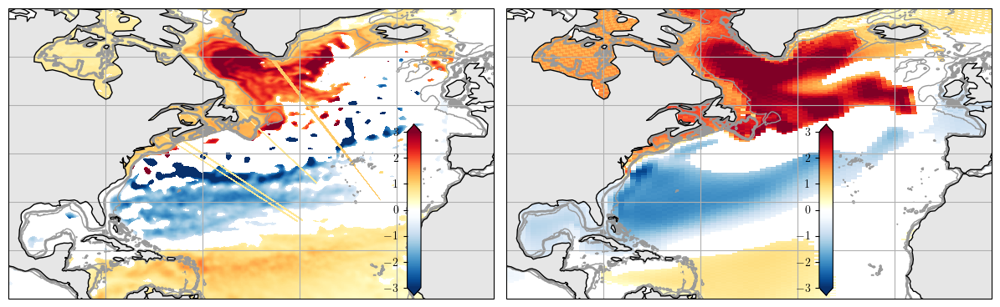

In [124]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, False)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


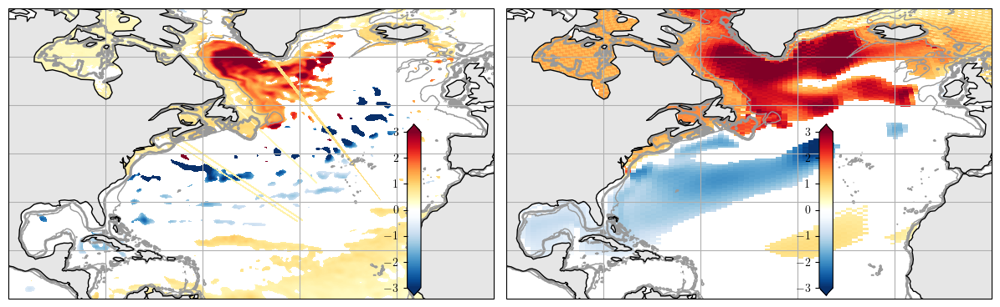

In [131]:
##SSH leads by 2 years
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 2, False)

## Regression of full simulation modes on Momentum-forced SSH

In [133]:
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_hr_ssh_m-r_det.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
ssh['time']=da_alt.time
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

dahr=ssh.groupby('time.year').mean('time').rename({'year':'time'})#

ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_lr_ssh_m.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

ssh['time']=da_alt.time
dalr=ssh.groupby('time.year').mean('time').rename({'year':'time'})

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


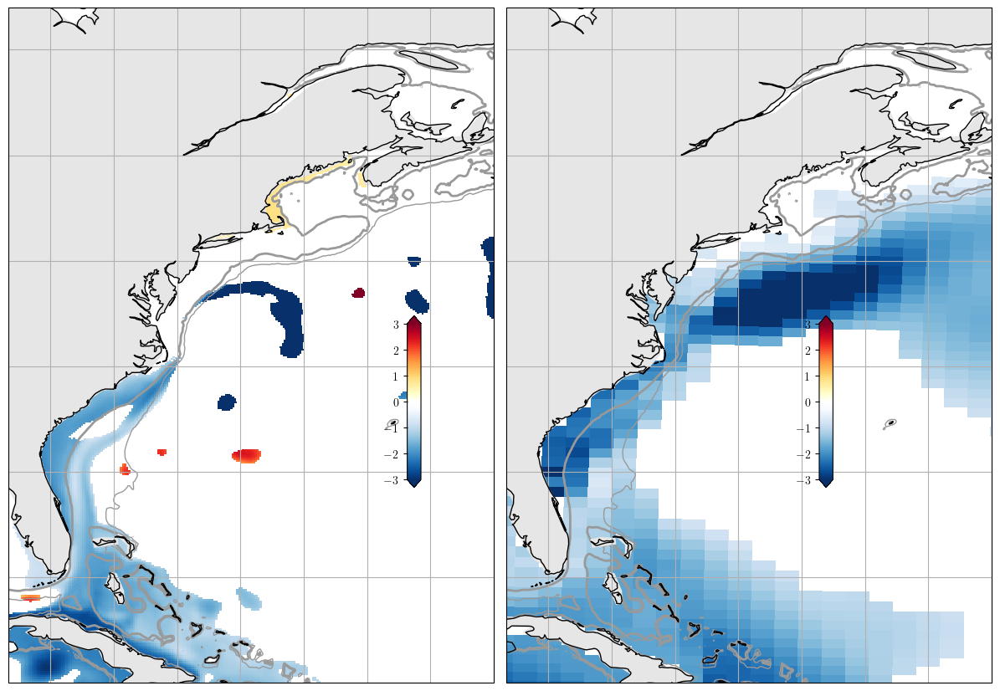

In [134]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, True)

* weak penetration of momentum forced signal N of hatteras in HR. Limited evidence for coherent offshore anomaly.
* more coherence with caribbean sea (also evident in LR)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


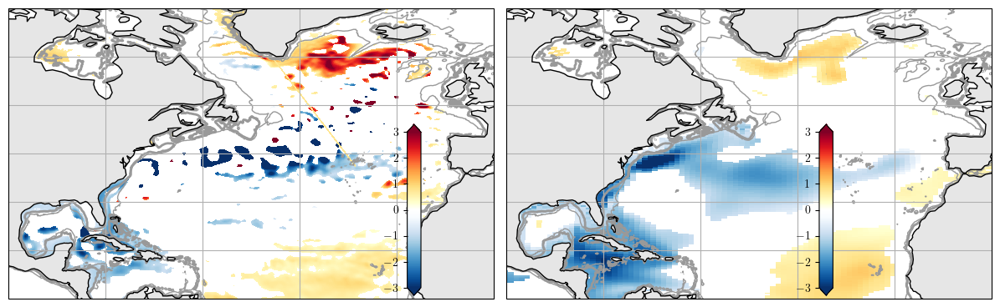

In [135]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, False)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


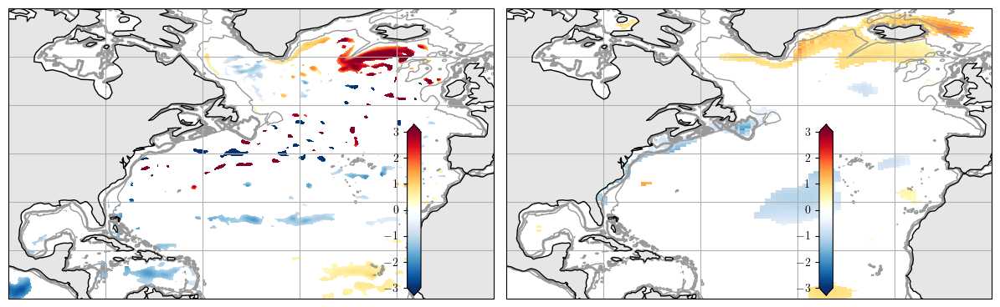

In [136]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 2, False)

## part 3: propagation of SH signal and response of GS.

# MONTHLY ANALYSIS

In [144]:
focustg1='234'
focustg2='1111'

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/3311196256.py:8: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


Text(0.4, 0.86, '$\\bf{Charleston I}$')

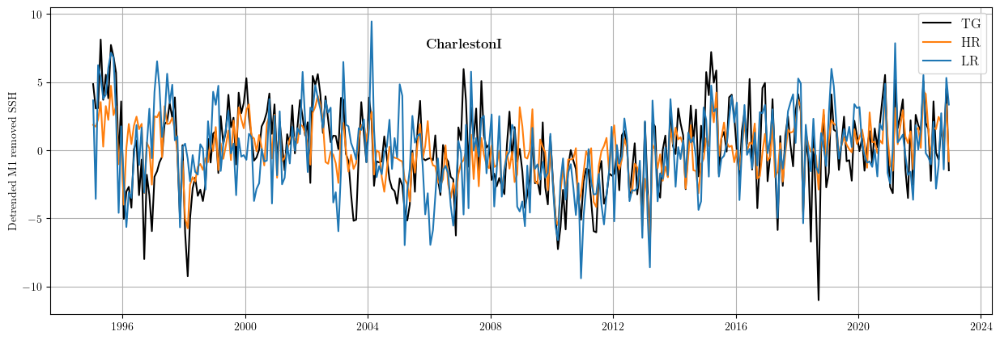

In [145]:
fig = plt.figure(figsize=(15,13))#, tight_layout=True)
ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
for nsim in np.arange(3):
    line = ax.plot(da_rem_m1[nsim].time,da_rem_m1[nsim].sel(tgindex=focustg1),cols[nsim], label = 'data')

plt.grid()
plt.ylabel('Detrended M1 removed SSH')
ax.legend([],     # The line objects
       labels=["TG","HR","LR"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=12,# Title for the legend
         )
plt.figtext(0.4, .86, r"$\bf{" + str(shortname[focustg1]) + '' "}$", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/4184932827.py:8: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


Text(0.4, 0.86, '$\\bf{Nantucket Island}$')

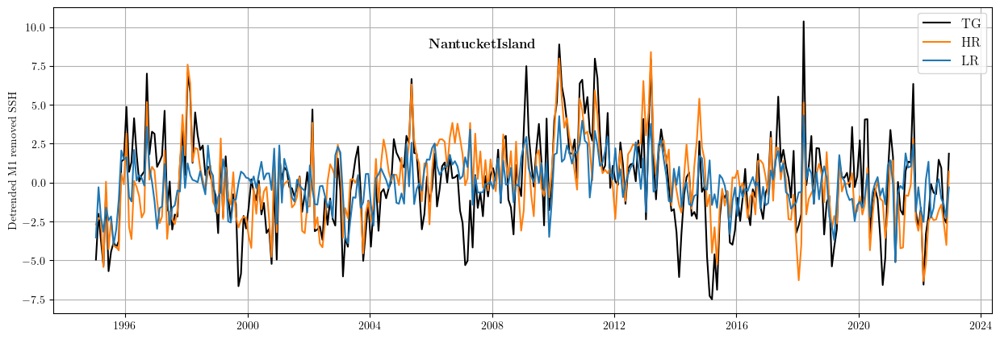

In [146]:
fig = plt.figure(figsize=(15,13))#, tight_layout=True)
ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
for nsim in np.arange(3):
    line = ax.plot(da_rem_m1[nsim].time,da_rem_m1[nsim].sel(tgindex=focustg2),cols[nsim], label = 'data')

plt.grid()
plt.ylabel('Detrended M1 removed SSH')
ax.legend([],     # The line objects
       labels=["TG","HR","LR"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=12,# Title for the legend
         )
plt.figtext(0.4, .86, r"$\bf{" + str(shortname[focustg2]) + '' "}$", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)

In [147]:
nao=xr.open_dataset('nao.long.nc')
nao=nao.value.sel(time=slice('1994-12-31','2022-12-31'))
nao_mo=-nao/nao.std(dim='time')

In [148]:
def plot_obs_pcs2b(tgpcs,eofsin,expvar,expvar2,rec_eofs,vmaxin, varscale,nsim):
    fig = plt.figure(figsize=(15,13))#, tight_layout=True)
    plt.subplots_adjust(wspace=0.1, hspace=0.2)

    cmap = 'plasma'
    cmap = mycolors.blue2red_cmap(20)
    ylabspacing = 2
    
    vmin = -vmaxin
    vmax = -vmin
    nmode=0
    for nsim in np.arange(3):
        ax = plt.subplot2grid((5,3), (1, nsim), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
        pos = ax.get_position() # get the original position 

        tt=rec_eof_ts[nsim][nmode,:,:]+da_rem_m1[nsim]*0
        ccoef=xr.corr(tt,da_rem_m1[nsim])**2
        # if nmode<1:    
        #     VE=recs_m1[nsim].var(dim='time')/tot_var
        # else:
        #     if nmode<2:    
        #         VE=recs_m2[nsim].var(dim='time')/tot_var
        #     else:
        #         VE=recs_m3[nsim].var(dim='time')/tot_var
        if nsim>1:
            plotvar=-eofsin[nsim][nmode,:]
        else:
            plotvar=eofsin[nsim][nmode,:]
            
        filled1 = plt.scatter(
            x=tgs_in.lon,
            y=tgs_in.lat,
            vmin=vmin,
            vmax=vmax,
            c=plotvar,
            cmap=cmap,  # this is the changes
            s=varscale*ccoef,
            alpha=1,
            edgecolors="k",
            linewidth=1,
            # marker=None,
            zorder=7,
            transform=xccrs.PlateCarree(),
        )  ## Important
        
        for nkey in np.arange(2):
            varval=varscale*(.25+.5*nkey)
            
            varkey = plt.scatter(
                x=tgs_in.lon,
                y=tgs_in.lat,
                vmin=vmin,
                vmax=vmax,
                c=eofsin[nsim][nmode,:]*0,
                cmap=cmap,  # this is the changes
                s=varval,
                alpha=1,
                edgecolors=".6",
                linewidth=1,
                # marker=None,
                zorder=7,
                transform=xccrs.PlateCarree(),
            )  ## Important
            
            varkey.set_facecolor("none")   
        
        ax.set_extent([-90, -78, 20, 48], crs=xccrs.PlateCarree())        
        ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
        ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
        ax.add_feature(cfeature.LAKES,zorder=3)

        ax.coastlines(zorder=5)
        ax.gridlines()

        if nmode<1:
            cbar_ax = fig.add_axes(
                [pos.x0+(pos.x1 - pos.x0)/4, pos.y0+(pos.y1 - pos.y0)/4, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
            )
            cbar = fig.colorbar(filled1, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
            cbar.ax.set_title("EOF (cm/SD)", rotation=0, size=10, weight="bold")
            cbar.ax.tick_params(labelsize=10)
                
        # ax.text(.02,.95, 'PC' + str(nsp+1) + ' lags by ' + str(lagx) + ' months' , transform=ax.transAxes, fontsize=12, weight='bold')
        # plt.figtext(-110,-40, "LF VE. = {:.0}".format(VE[nsp]), horizontalalignment='right', verticalalignment='center', fontsize=16, transform=ax.transAxes)
        # plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + 'EOF'+str(nmode+1), horizontalalignment='left', 
        plt.figtext(0.02, .95, r"$\bf{" + panellabs[nmode] + '' "}$" + '', horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)
        plt.figtext(0.02, .04, ''+'{0:.0f}'.format(expvar_eofs[nsim][nmode])+"\%", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)
   

    # import matplotlib.dates as mdates
    ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
    for nsim in np.arange(3):
        if nsim>1:
            plotvar=-tgpcs[nsim][:,0]
        else:
            plotvar=tgpcs[nsim][:,0]
        line = ax.plot(da_rem_m1[nsim].time,plotvar,cols[nsim], label = 'data')
    line = ax.plot(da_rem_m1[nsim].time,nao_mo,'k--')
    plt.grid()
    plt.ylabel('Normalized PC')
    ax.legend([],     # The line objects
           labels=["TG","HR","LR","NAO"],   # The labels for each line
           loc="upper right",   # Position of legend
           borderaxespad=0.4,    # Small spacing around legend box
           title="",
           fontsize=12,# Title for the legend
             )
    plt.figtext(0.02, .86, r"$\bf{" + panellabs[3] + '' "}$", horizontalalignment='left', 
                    verticalalignment='bottom', fontsize=12, transform=ax.transAxes)



In [149]:
kwargs = dict(n_modes=len(xr_tg.T)-1,random_state=2)#, normalize=True)
expvar_eofs=[]
expvar_lfcs=[]
expvar_lfcs2=[]
pcs=[]
eofs=[]
rec_eof_ts=[]
rec_lfp_ts=[]
da_w_m1=[]
lfcs=[]
lfps=[]
phases=[]
lf_tss=[]
# recvar=[]
# real_ts=[]
cuts=[2]
cutoff=cuts[0]
truncation=6
nmodes=truncation
rec_lfp=np.tile(da_rem_m1[nsim].values[np.newaxis,:, :]*0, [nmodes,1,1])
rec_var=rec_lfp[:,0,:]
rec_vars=[]
rec_eof=[]

for nsim in np.arange(3):
    dain=da_rem_m1[nsim]
            
    lfc, lfp, weights, r, pvar, pc, eof, ntr, pvar_slow, pvar_lfc, r_eofs, pvar_slow_eofs, lf_ts = tg_lfca(dain, cutoff, truncation)
    expvar_lfc = pvar_slow #fraction of total SSH variance
    expvar_lfc2 = pvar_lfc #fraction of total SSH variance
    # lfp=lfp[np.argsort(-expvar_lfc),:]
    # lfc=lfc[:,np.argsort(-expvar_lfc)]
    # expvar_lfc=expvar_lfc[np.argsort(-expvar_lfc)]
    expvar_eof = pvar
    rec_eof=np.tile(da_rem_m1[nsim].values[np.newaxis,:, :]*0, [nmodes,1,1])
    
    for nmode in np.arange(nmodes):
        rec_eof[nmode,:,:]=np.outer(pc[:,nmode],eof[nmode,:])
        rec_lfp[nmode,:,:]=np.outer(lfc[:,nmode],lfp[nmode,:])
        diag_pear_coef = [sp.stats.pearsonr(rec_lfp[nmode,:, i], lf_ts[:, i])[0] for i in range(rec_lfp.T.shape[0])]
        ve=(np.array(diag_pear_coef)) #**2)
        rec_var[nmode,:]=ve
    
    # da_w_m1.append(dain)
    expvar_eofs.append(expvar_eof)
    expvar_lfcs.append(expvar_lfc)
    expvar_lfcs2.append(expvar_lfc2)
    # real_ts.append(dain)
    rec_vars.append(rec_var)
    pcs.append(pc)
    lfcs.append(lfc)
    eofs.append(eof)
    lfps.append(lfp)
    lf_tss.append(lf_ts)
    rec_eof_ts.append(rec_eof)
    rec_lfp_ts.append(rec_lfp)

In [150]:
# pcs2=pcs.copy()
# eofs2=eofs.copy()
norm_fac=pcs[0][:,0].std()

for nsim in np.arange(len(pcs)): 
    # total_var=real_ts[nsim].var(dim='time')
    # print(norm_fac)
    # print(pcs[nsim][1,0])
    pcs[nsim][:,0]=pcs[nsim][:,0]/norm_fac
    # print(pcs[nsim][1,0])
    eofs[nsim][0,:]=eofs[nsim][0,:]*norm_fac
    # eofs[nsim]=eofs[nsim].T

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/1914295765.py:103: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


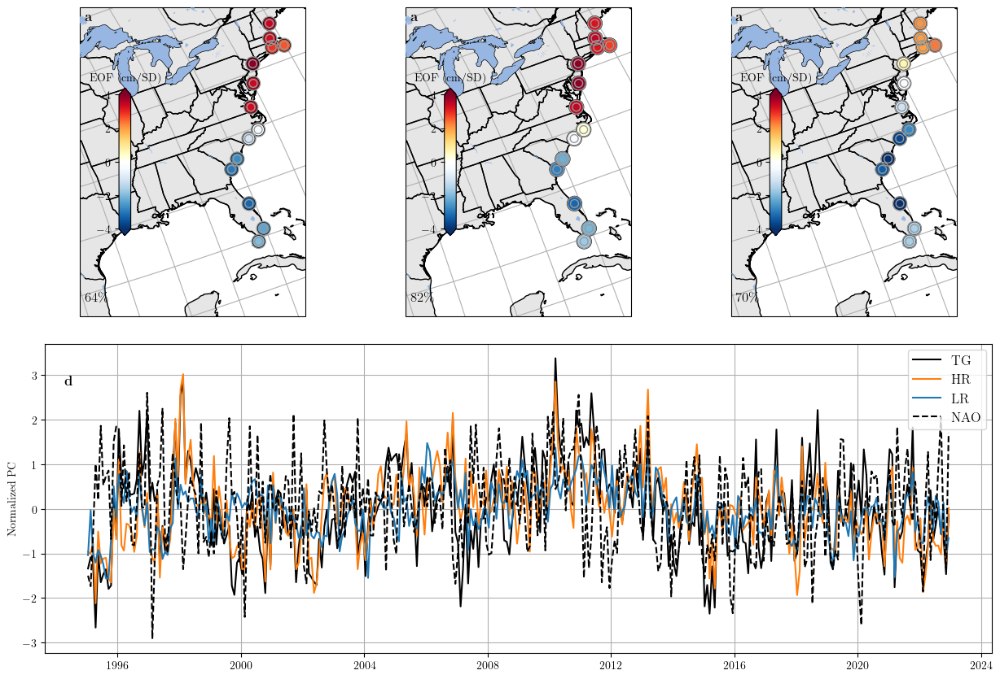

In [151]:
plot_obs_pcs2b(pcs,eofs,expvar_eofs,expvar_eofs,rec_eof_ts,4, 200, 0)#amps[nsim][0:2,:].max())
## limit to modes > 10% of LF. Or just #1 and #2.
## looking for coherent *non-linear* variability.

/glade/derecho/scratch/clittle/tmp/ipykernel_45311/2549766216.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]


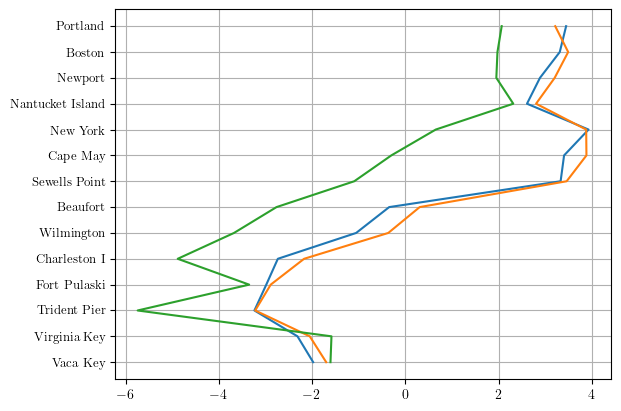

In [152]:
ax = plt.subplot2grid((1,1), (0,0), colspan=1, rowspan=1)    
plt.plot(eofs[0][0,:],np.arange(len(tgnames)))
plt.plot(eofs[1][0,:],np.arange(len(tgnames)))
plt.plot(-eofs[2][0,:],np.arange(len(tgnames)))
# plt.plot(eofs[1][0,:])
# plt.plot(-eofs[2][0,:])
# plt.plot(eofs[2][:,0]-eofs[0][:,0])
ticks = np.arange(0, len(tgnames), ylabspacing)
labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
ax.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
plt.grid()


In [164]:
def plot_ssh_reg2(tgpcs,SSH,tglons,tglats, lagx, coast_reg=True):
    fig = plt.figure(figsize=(18,12), tight_layout=True)
    vmin=-5
    vmax=-vmin
    
    cmap = mycolors.blue2red_cmap(20)
    
    for nsp in np.arange(1):
        for nsim in [1,2]:#np.arange(3):# [1,2]: #[1,2]:#
            pc2=tgpcs[nsim].T
            if nsim>1:
                pc2=-pc2
            # lagx=0
            lons=SSH[nsim].TLONG.fillna(0)
            lats=SSH[nsim].TLAT.fillna(0)
            tgpcs=tgpcs
            regressand=SSH[nsim] 
            # regressand2=xr_tg.TG_IB_CORR
                    
            focusts=regressand[:,0,0].fillna(0)*0+np.real(pc2[nsp,:])
            cov,cor,slope,intercept,pval,stderr = lag_linregress_3D(x=focusts,y=regressand, lagx=lagx)
            altrc=slope+regressand[0,:,:]*0
            altpval=pval
            mask=1+0/(pval<pvalc)
            # focusts=regressand2.isel(tgindex=0).squeeze()*0+np.real(tgpcs[nsp,:])
            # cov,cor,slope,intercept,pval,stderr = lag_linregress_3D(x=focusts,y=regressand2, lagx=lagx)
            
            ax = plt.subplot2grid((1,3), (0, nsim), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")
            
            pos = ax.get_position() # get the original position 
            if coast_reg:
                ax.set_extent([-83, -60, 20, 52], crs=xccrs.PlateCarree())
            else:
                ax.set_extent([-100, 0, 10, 70], crs=xccrs.PlateCarree())
            im = ax.pcolormesh(lons, lats, mask*altrc, shading='nearest', vmin=vmin, vmax=vmax, 
            # im = ax.pcolormesh(lons, lats, altrc, shading='nearest', vmin=vmin, vmax=vmax, 
                        cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    

            CS2 = ax.contour(ds_bathy.depth.longitude ,ds_bathy.depth.latitude, -ds_bathy.depth,
                            np.arange(100,101,1),colors='.6',linewidths=2,zorder=2,transform=xccrs.PlateCarree())
            
            CS2 = ax.contour(ds_bathy.depth.longitude ,ds_bathy.depth.latitude, -ds_bathy.depth,
                           np.arange(1000,2000,1000),colors='.6',linewidths=1,zorder=2,transform=xccrs.PlateCarree())

            if nsp==0:
                cbar_ax = fig.add_axes(
                    [pos.x1-(pos.x1 - pos.x0)/10, pos.y0+(pos.y1 - pos.y0)/10, (pos.x1 - pos.x0)/25, (pos.y1 - pos.y0)/2]
                )
                cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
                # cbar.ax.set_title("Reg. Coef. on PC" + str(nmode+1), rotation=0, size=10, weight="bold")
                cbar.ax.tick_params(labelsize=10)
                
            # if nsim<1:
            #     plt.figtext(.05, .95, 'Regression on HR PC'+str(nsp+1), horizontalalignment='left', verticalalignment='center', fontsize=20, transform=ax.transAxes)
            # else:
            #     plt.figtext(.05, .95, 'Regression on LR PC'+str(nsp+1), horizontalalignment='left', verticalalignment='center', fontsize=20, transform=ax.transAxes)
                            
            ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
            # ax.add_feature(cfeature.STATES, edgecolor='k',zorder=3)
    
            ax.coastlines(zorder=5)
            ax.gridlines()
            # ax.text(.02,.95, 'PC' + str(nsp+1) + ' lags by ' + str(lagx) + ' months' , transform=ax.transAxes, fontsize=12, weight='bold')
    # return altrc

In [161]:
# WITH REMOVAL from SSH field
da_ann=SSHs_m1rem[0]
dahr=SSHs_m1rem[1]
dalr=SSHs_m1rem[2]

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


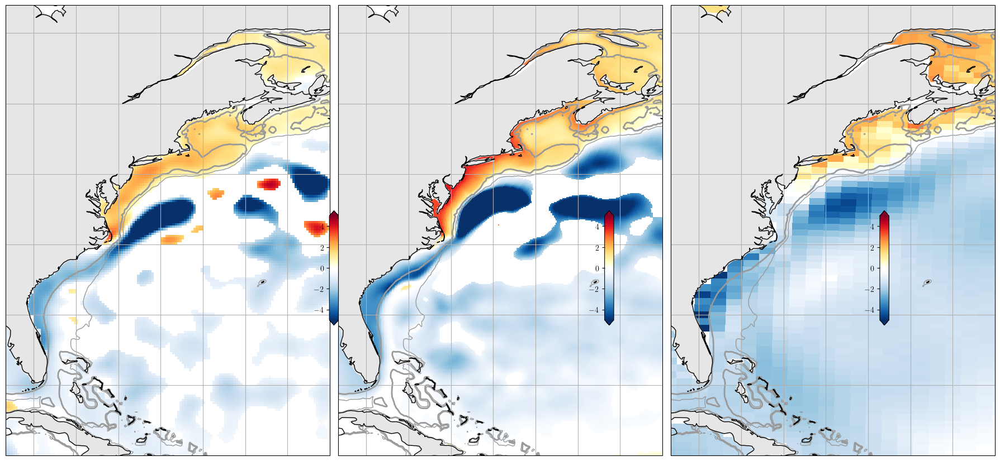

In [162]:
SSHs=[]
pvalc=.05
SSHs.append(da_alt)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, True)

## part 2: origin of the bias in LR

In [48]:
## note the uniformly more negative response in LR. suggests a missing compoent with a relatively uniform coastal expression.

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


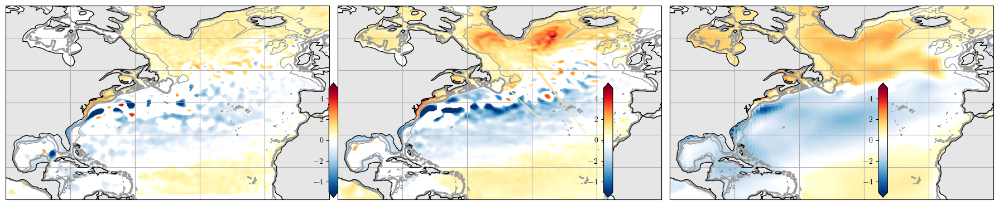

In [163]:
SSHs=[]
pvalc=.05
SSHs.append(da_alt)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, False)

In [157]:
## signals are similar but there is a strong enhancement from Hatteras to CC increasing the reg coef. suggests a locally enhanced response there.

## Regression of full simulation modes on Momentum-forced SSH

In [165]:
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_hr_ssh_m-r_det.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
ssh['time']=da_alt.time
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

dahr=ssh#.groupby('time.year').mean('time').rename({'year':'time'})#

ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_lr_ssh_m.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

ssh['time']=da_alt.time
dalr=ssh#.groupby('time.year').mean('time').rename({'year':'time'})

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


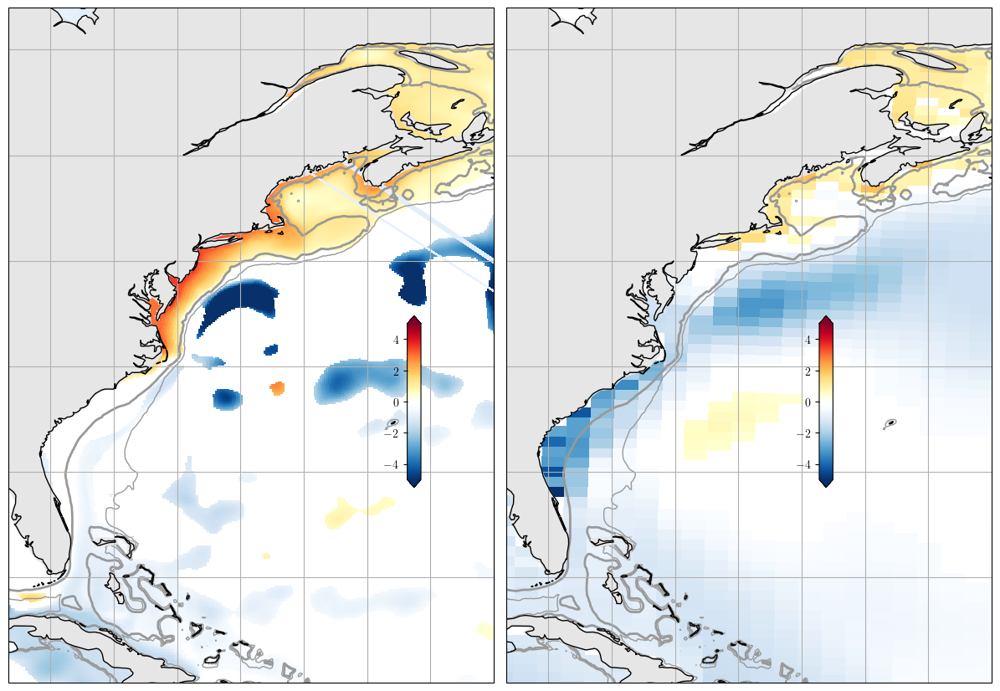

In [166]:
SSHs=[]
pvalc=.05
SSHs.append(dahr)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, True)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


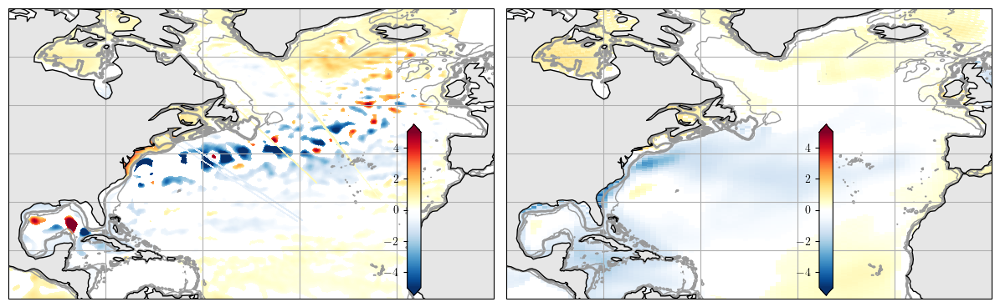

In [167]:
SSHs=[]
pvalc=.05
SSHs.append(dahr)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, False)

## Regression of full simulation modes on Buoyancy-forced SSH

In [62]:
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_hr_ssh_b_det.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
ssh['time']=da_alt.time
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

dahr=ssh#.groupby('time.year').mean('time').rename({'year':'time'})#

ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/big_alpaca_lr_ssh_b.nc')
ssh=ssh.ssh.isel(time=slice(24,336+24))
# ssh=ssh.rename({'nlat':'lat','nlon':'lon'})

ssh['time']=da_alt.time
dalr=ssh#.groupby('time.year').mean('time').rename({'year':'time'})

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


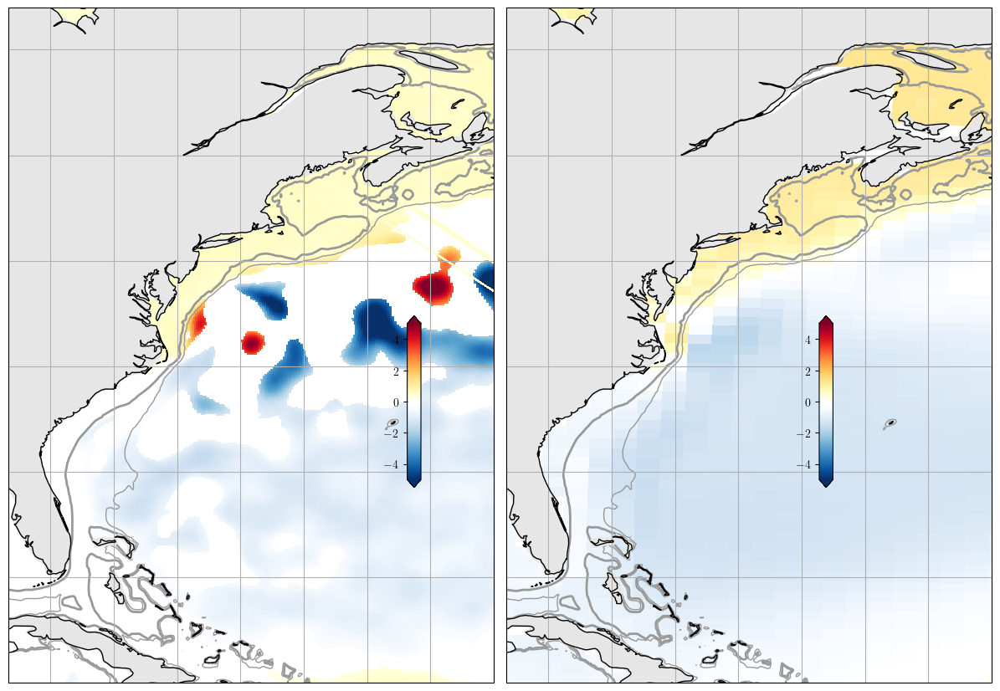

In [63]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, True)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


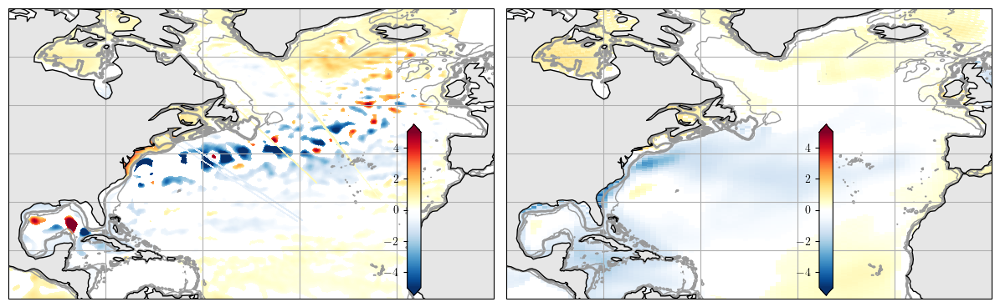

In [168]:
SSHs=[]
pvalc=.05
SSHs.append(da_ann)
SSHs.append(dahr)
SSHs.append(dalr)
plot_ssh_reg2(pcs,SSHs,da.lon,da.lat, 0, False)